In [1]:
#Importing Liabraries amd models and metrics for analysis and model creation
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import Lasso,Ridge
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor,RadiusNeighborsRegressor
from sklearn.svm import SVR
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Impoting Train file & data
#Setting option to show max rows and max columns
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows", None)
df=pd.read_csv("Housing_train.csv")
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [3]:
#Impoting test file & data
#Setting option to show max rows and max columns
df1=pd.read_csv("Housing_test.csv")
df1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [4]:
#Checking Shape of the train and test data
df.shape,df1.shape

((1168, 81), (292, 80))

In [5]:
#Checking data of the train data
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [6]:
#Checking data type of test data
df1.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [7]:
#Checking the null value-No null value found 
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

<AxesSubplot:>

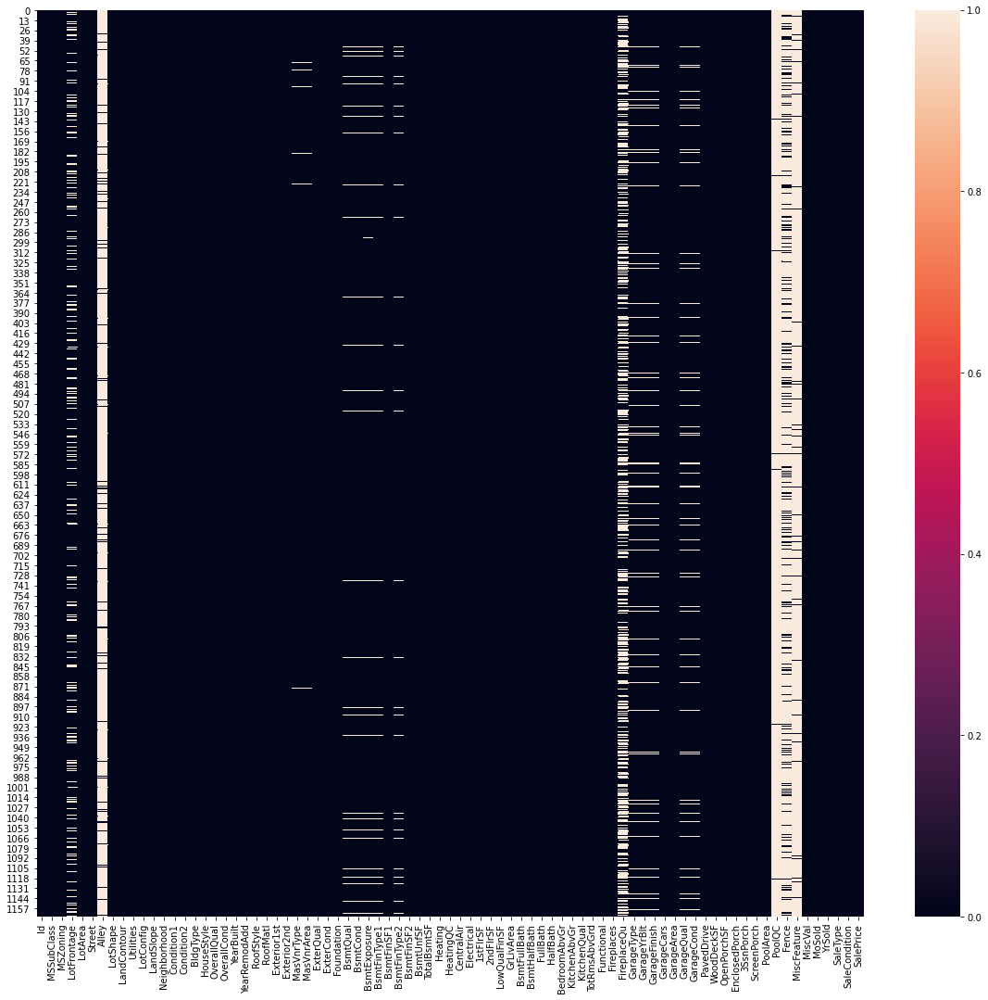

In [8]:
#Checking null Values
plt.figure(figsize=(20,18))
sns.heatmap(df.isnull())

In [9]:
#Since there are null values so we have to convert them into meaning values for further analysis
df["LotFrontage"].fillna(value=df["LotFrontage"].mean(), inplace=True)
df['Alley'].fillna("No alley access", inplace=True)
df['MasVnrType'].fillna("None", inplace=True)
df['MasVnrArea'].fillna(0, inplace=True)
df['BsmtQual'].fillna("NA", inplace=True)
df['BsmtCond'].fillna("NA", inplace=True)
df['BsmtExposure'].fillna("NA", inplace=True)
df['BsmtFinType1'].fillna("NA", inplace=True)
df['BsmtFinType2'].fillna("NA", inplace=True)
df['FireplaceQu'].fillna("NA", inplace=True)
df['GarageType'].fillna("NA", inplace=True)
most_value=df["GarageYrBlt"].mode().iloc[0]
df["GarageYrBlt"].fillna(value=most_value, inplace=True)
df['GarageFinish'].fillna("NA", inplace=True)
df['GarageQual'].fillna("NA", inplace=True)
df['GarageCond'].fillna("NA", inplace=True)
df['PoolQC'].fillna("NA", inplace=True)
df['Fence'].fillna("NA", inplace=True)
df['MiscFeature'].fillna("NA", inplace=True)

In [10]:
df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

# EXPLORATORY DATA ANALYSIS

In [11]:
#Checking Data
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.988470,10484.749144,6.104452,5.595890,1970.930651,1984.758562,101.696918,444.726027,46.647260,569.721747,1061.095034,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1979.717466,1.776541,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,22.437056,8957.442311,1.390153,1.124343,30.145255,20.785185,182.218483,462.664785,163.520016,449.375525,442.272249,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,25.012983,0.745554,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.988470,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,1096.500000,0.000000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1984.500000,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,79.250000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,1392.000000,729.000000,0.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2003.000000,2.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [12]:
#checking Correlation between the differnet columns 
df.corr()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.004259,-0.005969,-0.029212,-0.036965,0.039761,-0.016942,-0.018590,-0.061397,0.003868,0.005269,-0.019494,-0.013812,0.009647,-0.029671,-0.070180,-0.024325,0.023027,-0.043572,-0.015187,-0.028512,0.009376,0.001216,-0.001613,-0.024175,-0.002363,0.007549,0.010048,-0.027498,-0.013642,0.004885,-0.021773,0.005169,0.065832,0.001304,0.023479,-0.008853,-0.023897
MSSubClass,0.004259,1.000000,-0.336681,-0.124151,0.070462,-0.056978,0.023988,0.056618,0.028215,-0.052236,-0.062403,-0.134170,-0.214042,-0.227927,0.300366,0.053737,0.086448,0.004556,0.008207,0.140807,0.168423,-0.013283,0.283506,0.051179,-0.035792,0.093390,-0.027639,-0.092408,-0.022609,0.017468,-0.004252,-0.043210,-0.013291,0.009583,-0.023503,-0.016015,-0.038595,-0.060775
LotFrontage,-0.005969,-0.336681,1.000000,0.299452,0.229218,-0.047573,0.112655,0.088799,0.188108,0.228996,0.002159,0.113924,0.356107,0.403436,0.089675,0.007506,0.374251,0.094046,0.001389,0.171773,0.047816,0.237199,-0.002729,0.318771,0.230610,0.027832,0.260252,0.322644,0.088334,0.151328,0.020902,0.051084,0.030405,0.196001,-0.001329,0.022517,-0.003885,0.323779
LotArea,-0.029212,-0.124151,0.299452,1.000000,0.107188,0.017513,0.005506,0.027228,0.120192,0.221851,0.056656,0.006600,0.259733,0.312843,0.059803,-0.001915,0.281360,0.142387,0.059282,0.123197,0.007271,0.117351,-0.013075,0.184546,0.285983,-0.054091,0.158313,0.195162,0.216720,0.093080,-0.007446,0.025794,0.025256,0.097107,0.051679,0.015141,-0.035399,0.249499
OverallQual,-0.036965,0.070462,0.229218,0.107188,1.000000,-0.083167,0.575800,0.555945,0.403985,0.219643,-0.040893,0.308676,0.528285,0.458758,0.316624,-0.039295,0.599700,0.101732,-0.030702,0.548824,0.296134,0.099639,-0.178220,0.432579,0.390067,0.427205,0.596322,0.566782,0.227137,0.341030,-0.098374,0.045919,0.059387,0.072247,-0.025786,0.090638,-0.048759,0.789185
OverallCond,0.039761,-0.056978,-0.047573,0.017513,-0.083167,1.000000,-0.377731,0.080669,-0.135133,-0.028810,0.044336,-0.146384,-0.162481,-0.134420,0.036668,0.041877,-0.065006,-0.039680,0.091016,-0.171931,-0.052125,0.028393,-0.076047,-0.039952,-0.013632,-0.303182,-0.161996,-0.126021,0.012290,-0.024899,0.056074,0.040476,0.069463,-0.003603,0.075178,0.005519,0.055517,-0.065642
YearBuilt,-0.016942,0.023988,0.112655,0.005506,0.575800,-0.377731,1.000000,0.592829,0.318562,0.227933,-0.027682,0.155559,0.386265,0.279450,0.011834,-0.189044,0.198644,0.164983,-0.028161,0.471264,0.243227,-0.080639,-0.167869,0.095476,0.134313,0.702527,0.525346,0.473216,0.204830,0.191069,-0.373544,0.037079,-0.058760,0.006408,-0.030008,0.031754,-0.013976,0.514408
YearRemodAdd,-0.018590,0.056618,0.088799,0.027228,0.555945,0.080669,0.592829,1.000000,0.178583,0.114430,-0.044694,0.174732,0.280720,0.233384,0.155102,-0.072526,0.295048,0.104643,-0.011375,0.444446,0.194943,-0.035847,-0.139943,0.206923,0.118378,0.562284,0.428325,0.387744,0.197410,0.238755,-0.193574,0.064763,-0.046220,0.006874,-0.001199,0.024663,0.033265,0.507831
MasVnrArea,-0.061397,0.028215,0.188108,0.120192,0.403985,-0.135133,0.318562,0.178583,1.000000,0.263377,-0.064685,0.108974,0.362330,0.334512,0.172136,-0.070026,0.384386,0.084498,0.014974,0.264357,0.197831,0.091339,-0.039438,0.277737,0.241040,0.210228,0.340100,0.363537,0.152083,0.127876,-0.102142,0.019123,0.047375,0.013836,-0.027263,0.012707,-0.013220,0.460535
BsmtFinSF1,0.003868,-0.052236,0.228996,0.221851,0.219643,-0.028810,0.227933,0.114430,0.263377,1.000000,-0.052145,-0.499861,0.518940,0.445876,-0.127656,-0.070932,0.217160,0.645126,0.063895,0.054511,0.015767,-0.114888,-0.065450,0.043499,0.257482,0.104313,0.197529,0.286290,0.192939,0.108802,-0.082351,0.025485,0.

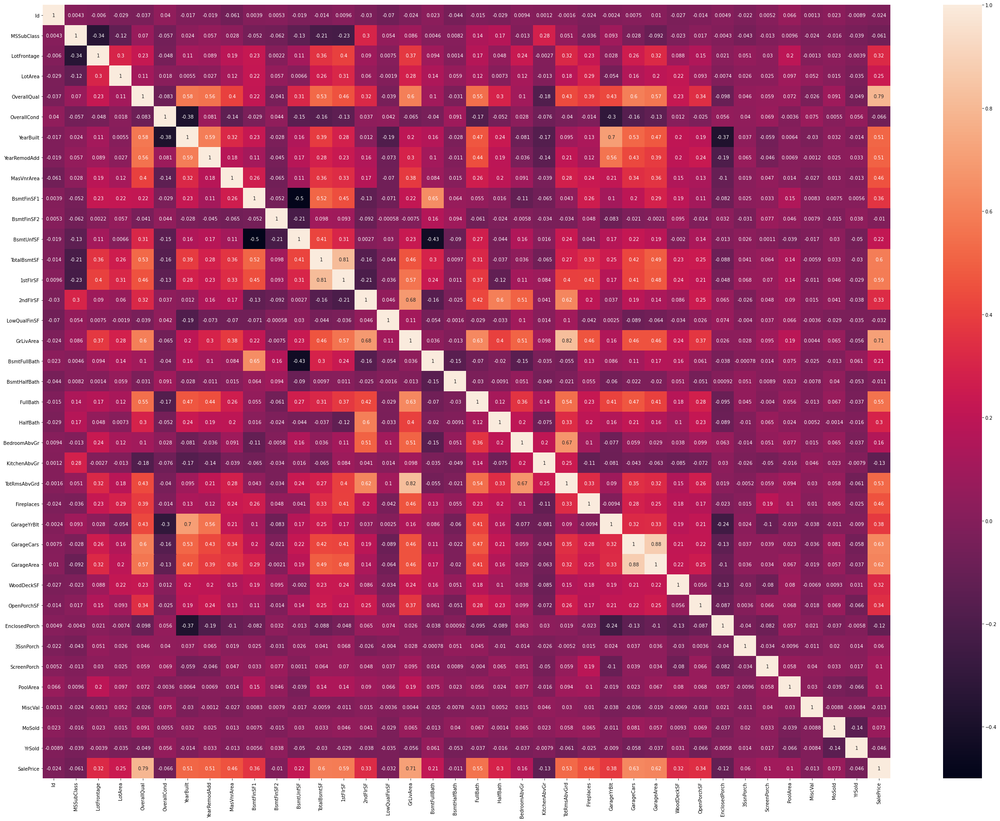

In [13]:
plt.figure(figsize=(40,30))
sns.heatmap(df.corr(),annot=True)
plt.show()

In [14]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,70.98847,4928,Pave,No alley access,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NA,NA,NA,0,2,2007,WD,Normal,128000
1,889,20,RL,95.00000,15865,Pave,No alley access,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NA,NA,NA,0,10,2007,WD,Normal,268000
2,793,60,RL,92.00000,9920,Pave,No alley access,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NA,NA,NA,0,6,2007,WD,Normal,269790
3,110,20,RL,105.00000,11751,Pave,No alley access,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NA,MnPrv,NA,0,1,2010,COD,Normal,190000
4,422,20,RL,70.98847,16635,Pave,No alley access,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NA,NA,NA,0,6,2009,WD,Normal,215000


In [15]:
#Lets check the unique values
print("Distinct values of each column")
for column in df:
    print(f'- {column}: {df[column].unique()}')

Distinct values of each column
- Id: [127 889 793 ... 196  31 617]
- MSSubClass: [120  20  60  50  70  30 160  85  45  90  40  80 190  75 180]
- MSZoning: ['RL' 'RM' 'FV' 'RH' 'C (all)']
- LotFrontage: [ 70.9884696  95.         92.        105.         58.         88.
  70.         80.         50.         44.        129.         59.
  55.         64.         24.         68.         71.         74.
  61.         60.        120.         84.        141.         30.
  65.         76.        100.         85.         75.        107.
 122.         82.         62.         73.         79.         77.
  41.         69.         90.         96.         72.         34.
  78.         63.         40.         98.        160.        108.
 128.         51.         81.         99.         66.         37.
 174.         87.         53.        152.         47.         86.
  56.         89.         35.         52.         21.        104.
  57.         83.         46.        101.        112.        149.
  93. 

In [16]:
df.nunique()

Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       107
LotArea           892
Street              2
Alley               3
LotShape            4
LandContour         4
Utilities           1
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         110
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        14
Exterior2nd        15
MasVnrType          4
MasVnrArea        283
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            5
BsmtCond            5
BsmtExposure        5
BsmtFinType1        7
BsmtFinSF1        551
BsmtFinType2        7
BsmtFinSF2        122
BsmtUnfSF         681
TotalBsmtSF       636
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          669
2ndFlrSF          351
LowQualFin

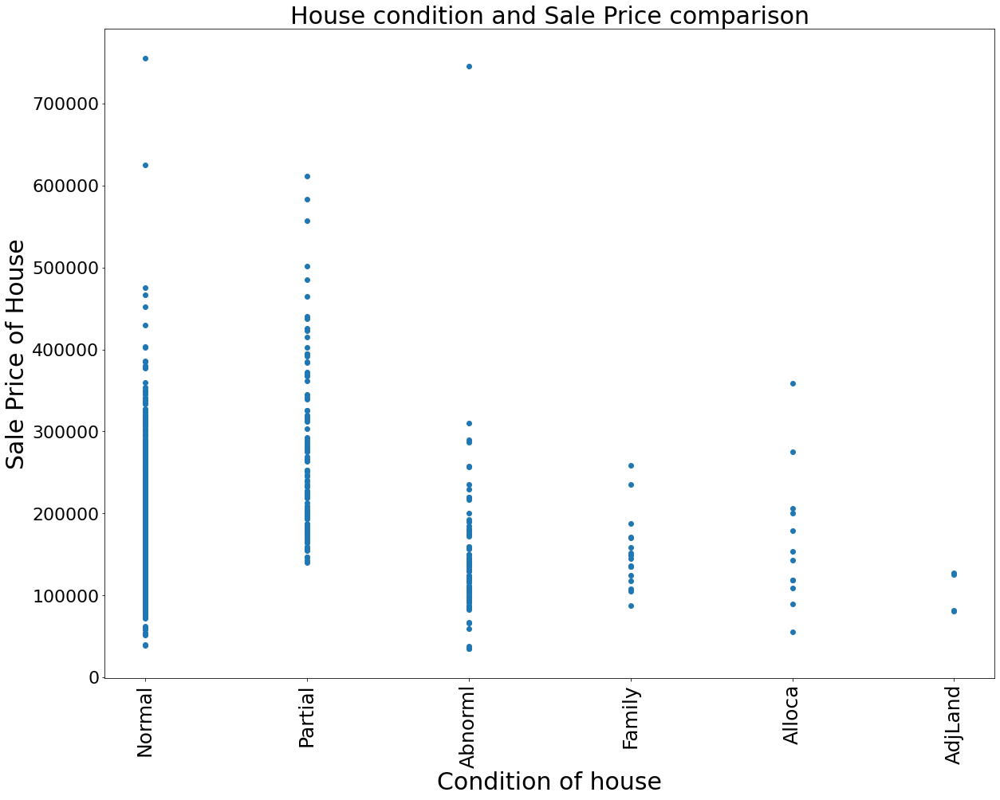

In [17]:
plt.figure(figsize=(20,15))
plt.scatter(df["SaleCondition"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("Condition of house",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('House condition and Sale Price comparison',fontsize = 30)
plt.show()

<Figure size 3600x2160 with 0 Axes>

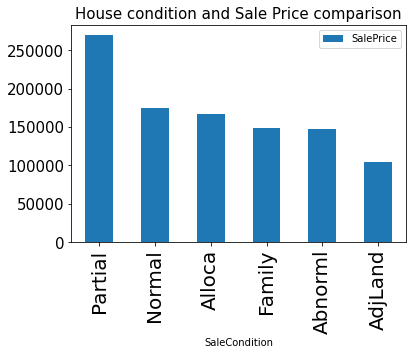

In [18]:
plt.figure(figsize=(50,30))
df3 = pd.DataFrame(df.groupby(["SaleCondition"])["SalePrice"].mean().sort_values(ascending = False))
df3.plot.bar()
plt.title('House condition and Sale Price comparison',fontsize=15)
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=15)
plt.show()

In [19]:
#converting year to number of years
df['YearBuilt'] = pd.datetime.now().year-df['YearBuilt']
df['YearRemodAdd']=pd.datetime.now().year-df['YearRemodAdd']
df['GarageYrBlt']=pd.datetime.now().year-df['GarageYrBlt']
df['YrSold'] = pd.datetime.now().year-df['YrSold']

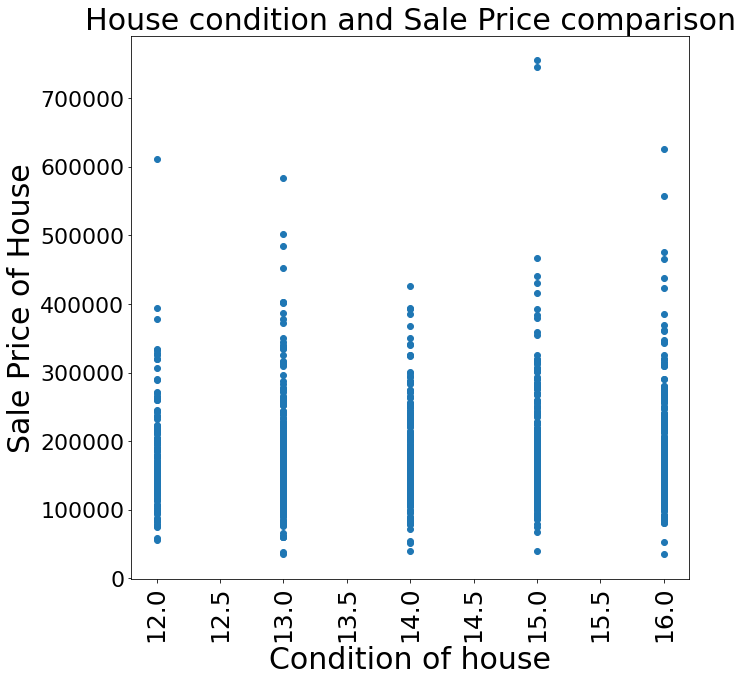

In [20]:
plt.figure(figsize=(10,10))
plt.scatter(df["YrSold"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("Condition of house",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('House condition and Sale Price comparison',fontsize = 30)
plt.show()

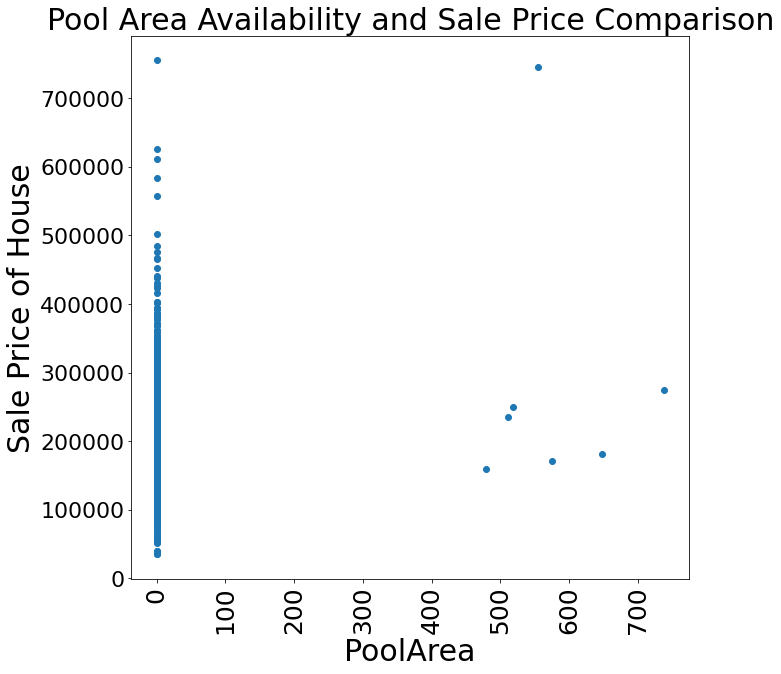

In [21]:
plt.figure(figsize=(10,10))
plt.scatter(df["PoolArea"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("PoolArea",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('Pool Area Availability and Sale Price Comparison',fontsize = 30)
plt.show()

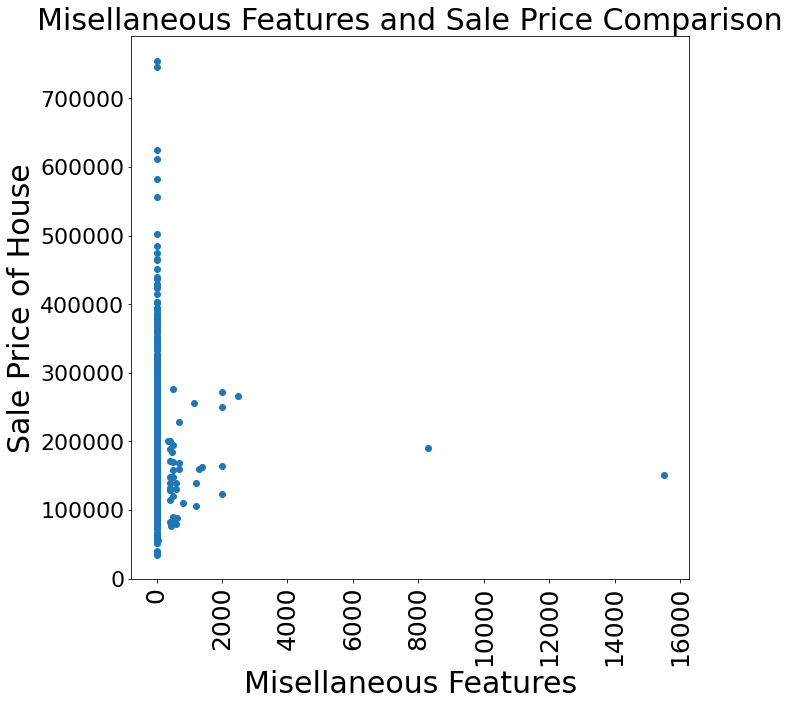

In [22]:
plt.figure(figsize=(10,10))
plt.scatter(df["MiscVal"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("Misellaneous Features",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('Misellaneous Features and Sale Price Comparison',fontsize = 30)
plt.show()

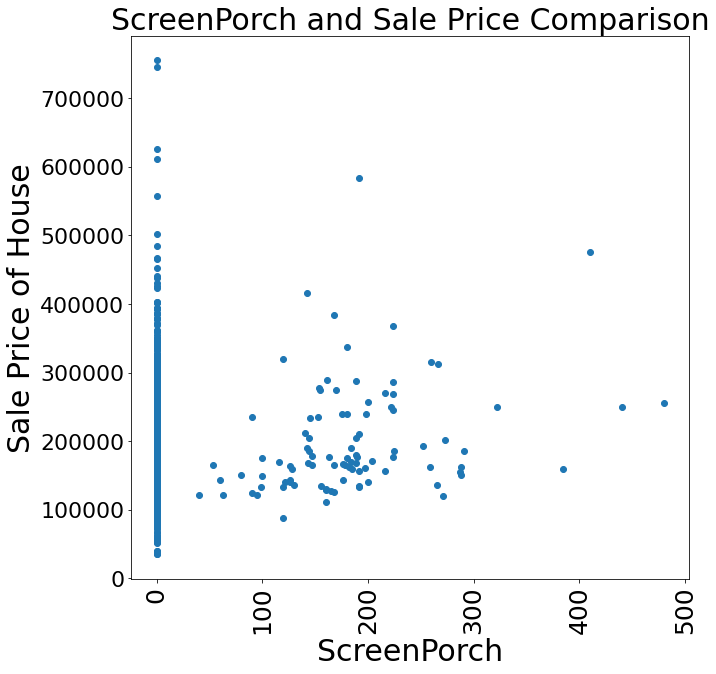

In [23]:
plt.figure(figsize=(10,10))
plt.scatter(df["ScreenPorch"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("ScreenPorch",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('ScreenPorch and Sale Price Comparison',fontsize = 30)
plt.show()

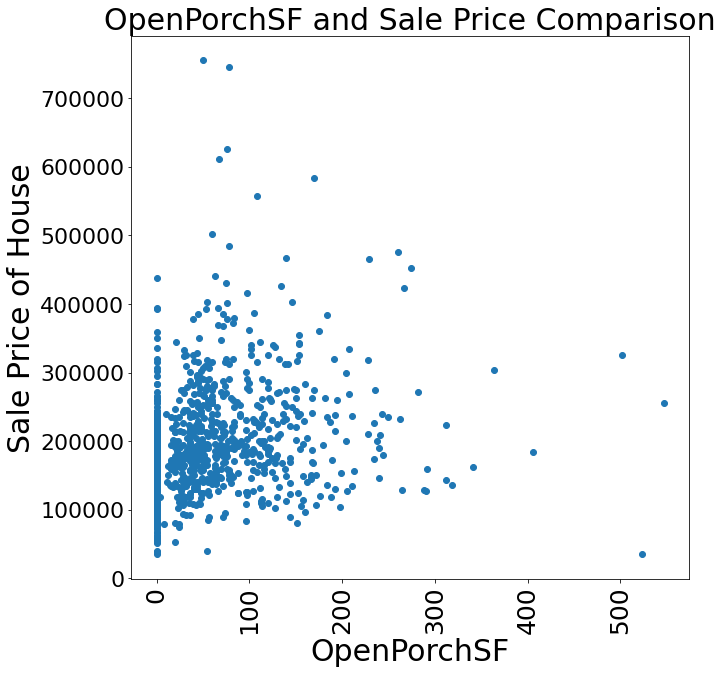

In [24]:
plt.figure(figsize=(10,10))
plt.scatter(df["OpenPorchSF"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("OpenPorchSF",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('OpenPorchSF and Sale Price Comparison',fontsize = 30)
plt.show()

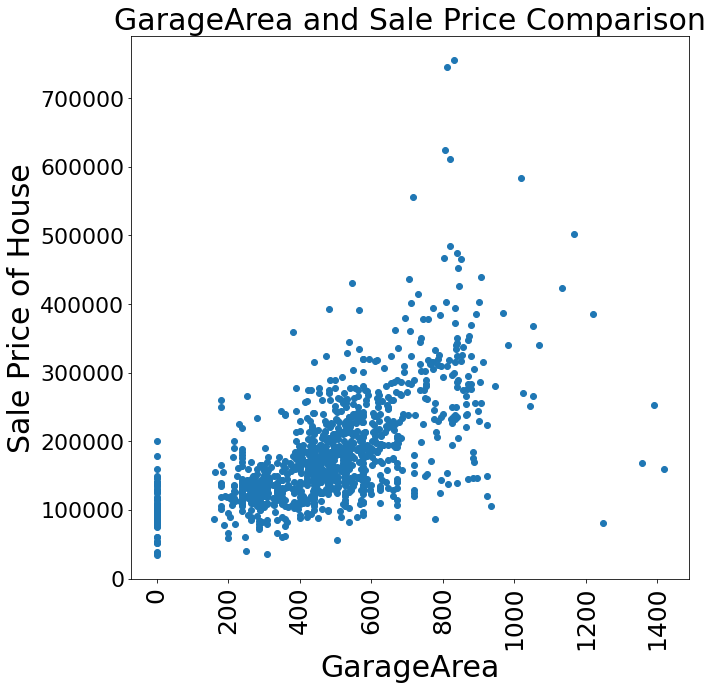

In [25]:
plt.figure(figsize=(10,10))
plt.scatter(df["GarageArea"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("GarageArea",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('GarageArea and Sale Price Comparison',fontsize = 30)
plt.show()

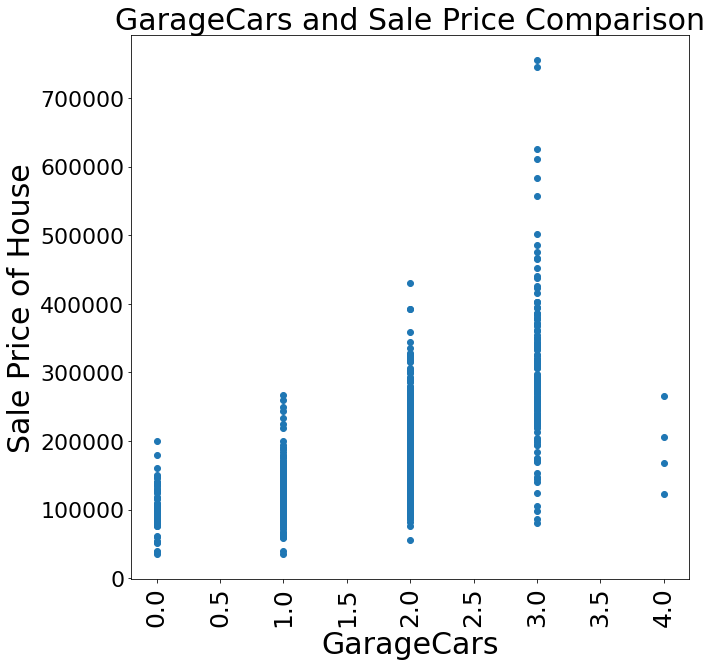

In [26]:
plt.figure(figsize=(10,10))
plt.scatter(df["GarageCars"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("GarageCars",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('GarageCars and Sale Price Comparison',fontsize = 30)
plt.show()

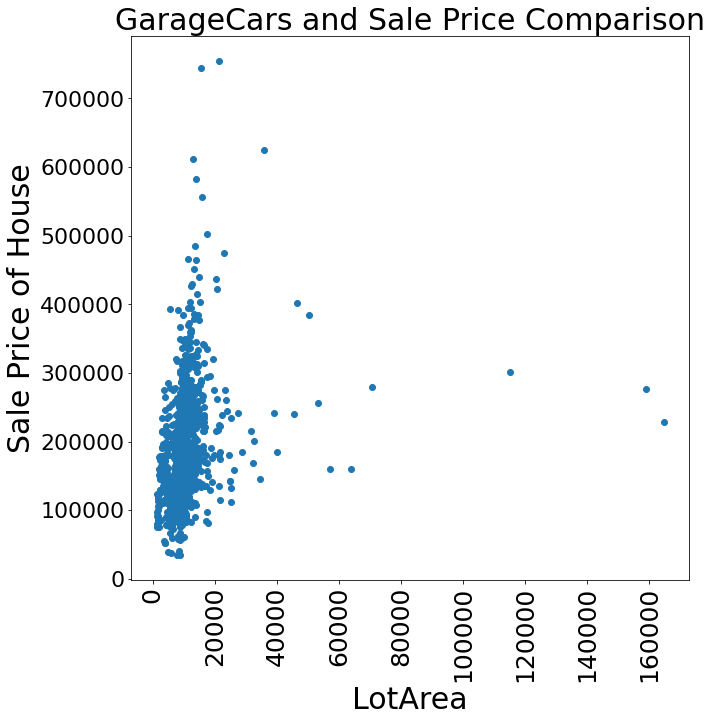

In [27]:
plt.figure(figsize=(10,10))
plt.scatter(df["LotArea"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("LotArea",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('GarageCars and Sale Price Comparison',fontsize = 30)
plt.show()

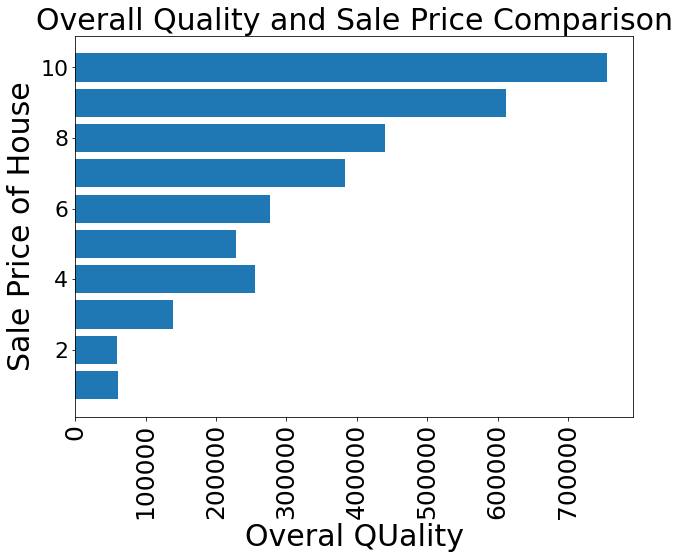

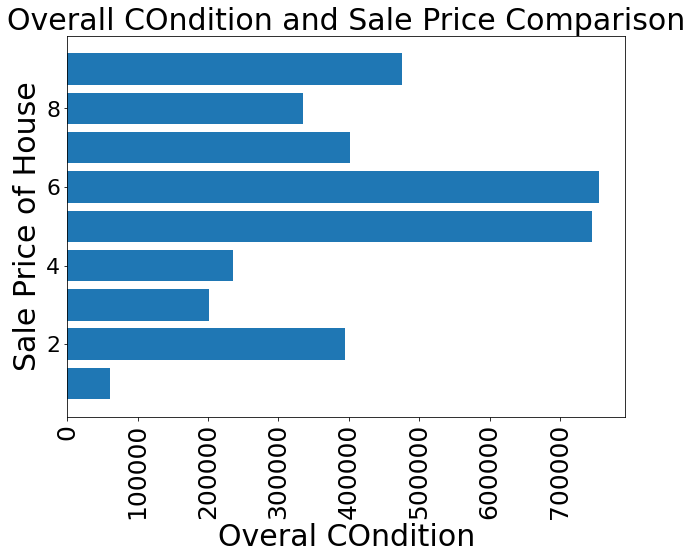

In [28]:
Quality = df['OverallQual']
price = df['SalePrice']
fig = plt.figure(figsize =(10, 7))
plt.barh(Quality, price)
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("Overal QUality",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('Overall Quality and Sale Price Comparison',fontsize = 30) 
plt.show()

Quality = df['OverallCond']
price = df['SalePrice']
fig = plt.figure(figsize =(10, 7))
plt.barh(Quality, price)
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("Overal COndition",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('Overall COndition and Sale Price Comparison',fontsize = 30) 
plt.show()

<Figure size 2160x1440 with 0 Axes>

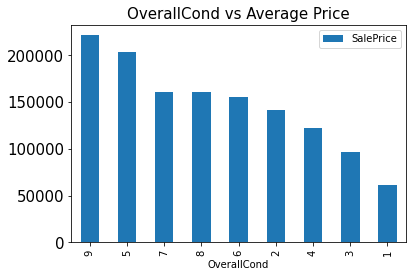

<Figure size 2160x1440 with 0 Axes>

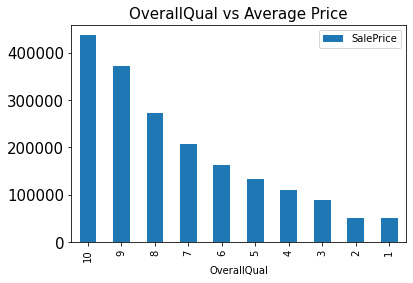

In [29]:
plt.figure(figsize=(30,20))
df9 = pd.DataFrame(df.groupby(['OverallCond'])['SalePrice'].mean().sort_values(ascending = False))
df9.plot.bar()
plt.title('OverallCond vs Average Price', fontsize=15)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=15)
plt.show()

plt.figure(figsize=(30,20))
df10 = pd.DataFrame(df.groupby(['OverallQual'])['SalePrice'].mean().sort_values(ascending = False))
df10.plot.bar()
plt.title('OverallQual vs Average Price', fontsize=15)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=15)
plt.show()

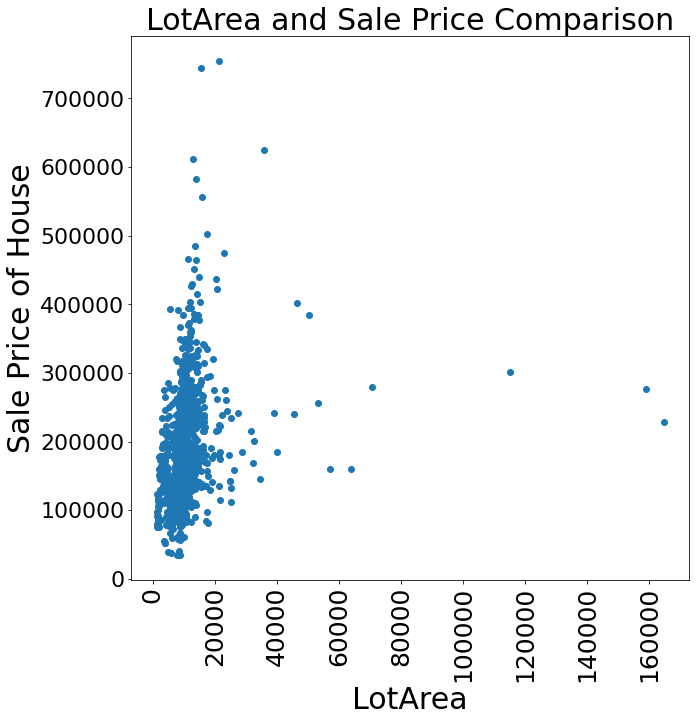

In [30]:
plt.figure(figsize=(10,10))
plt.scatter(df["LotArea"],df["SalePrice"])
plt.xticks(rotation = 90,fontsize = 25)
plt.yticks(fontsize = 22)
plt.xlabel("LotArea",fontsize = 30)
plt.ylabel("Sale Price of House",fontsize = 30)
plt.title('LotArea and Sale Price Comparison',fontsize = 30)
plt.show()

In [31]:
#Separating numerical and categorical fields for analysisng them separately using the provided Data Dictionary.

# OUTCOME COLUMN:
out_col = 'SalePrice'

# NUMERICAL COLUMNS: 
num_col = ['LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 
           'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
           'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 
           'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'YearBuilt', 'YearRemodAdd',
           'GarageYrBlt']
print(len(num_col))

# CATEGORICAL COLUMNS: 
cat_col = ['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
           'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
           'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 
           'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating',
           'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 
           'GarageQual', 'GarageCond', 'PavedDrive', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition']
print(len(cat_col))

# Listing distinct variables for each Categorical columns to address issues if any
for col in cat_col:
    print(col,' : ',df[col].unique())

30
43
MSSubClass  :  [120  20  60  50  70  30 160  85  45  90  40  80 190  75 180]
MSZoning  :  ['RL' 'RM' 'FV' 'RH' 'C (all)']
Street  :  ['Pave' 'Grvl']
LotShape  :  ['IR1' 'Reg' 'IR2' 'IR3']
LandContour  :  ['Lvl' 'Bnk' 'HLS' 'Low']
Utilities  :  ['AllPub']
LotConfig  :  ['Inside' 'CulDSac' 'FR2' 'Corner' 'FR3']
LandSlope  :  ['Gtl' 'Mod' 'Sev']
Neighborhood  :  ['NPkVill' 'NAmes' 'NoRidge' 'NWAmes' 'Gilbert' 'Sawyer' 'Edwards'
 'IDOTRR' 'CollgCr' 'Mitchel' 'Crawfor' 'BrDale' 'StoneBr' 'BrkSide'
 'NridgHt' 'OldTown' 'Somerst' 'Timber' 'SWISU' 'SawyerW' 'ClearCr'
 'Veenker' 'Blmngtn' 'MeadowV' 'Blueste']
Condition1  :  ['Norm' 'Feedr' 'RRAn' 'PosA' 'RRAe' 'Artery' 'PosN' 'RRNe' 'RRNn']
Condition2  :  ['Norm' 'RRAe' 'Feedr' 'PosN' 'Artery' 'RRNn' 'PosA' 'RRAn']
BldgType  :  ['TwnhsE' '1Fam' 'Duplex' 'Twnhs' '2fmCon']
HouseStyle  :  ['1Story' '2Story' '1.5Fin' 'SFoyer' '1.5Unf' 'SLvl' '2.5Fin' '2.5Unf']
OverallQual  :  [ 6  8  7  5  9  1  2  4  3 10]
OverallCond  :  [5 6 7 4 8 2 3 9 1]

In [32]:
# Function for Analysis of Numerical column
def num_col_analysis(i, col_i,col_o):
    plt.figure(i)
    sns.jointplot(x=col_i, y=col_o, data=df[[col_i,col_o]])

In [33]:
# Function for Analysis of Categorical column
def cat_col_analysis(i, col_i,col_o):
    plt.figure(i)
    variables = df[[col_i]].nunique()
    plt.figure(figsize=(variables,variables/1.77))
    my_order = df[[col_i,col_o]].groupby(by=[col_i])[col_o].median().sort_values(ascending=True)
    sns.boxplot(x=col_i, y=col_o, data=df[[col_i,col_o]], order=my_order.index)

<Figure size 432x288 with 0 Axes>

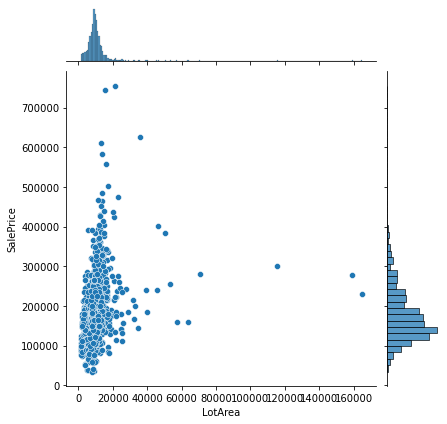

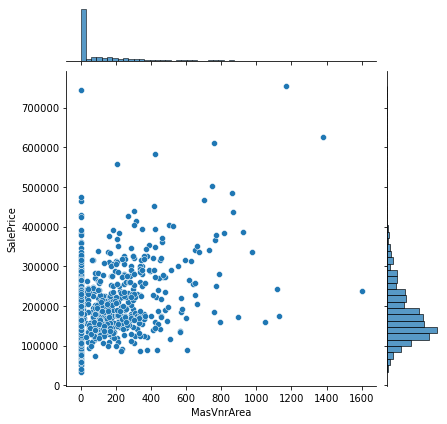

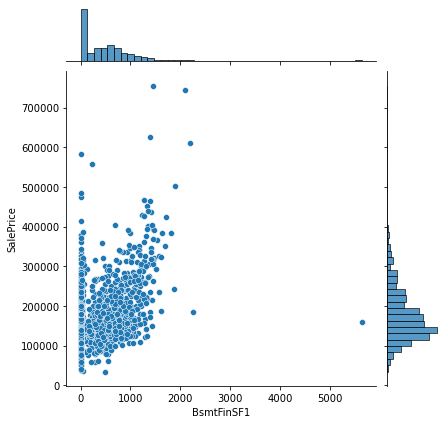

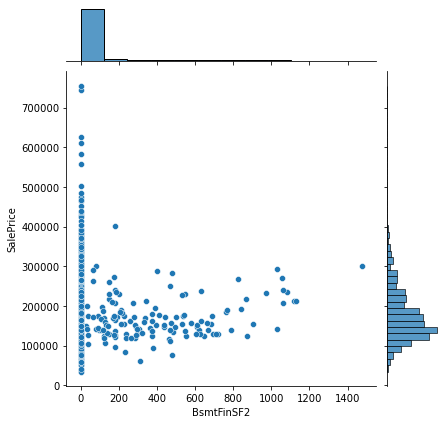

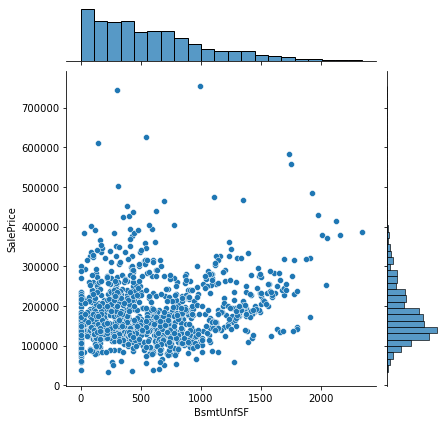

...

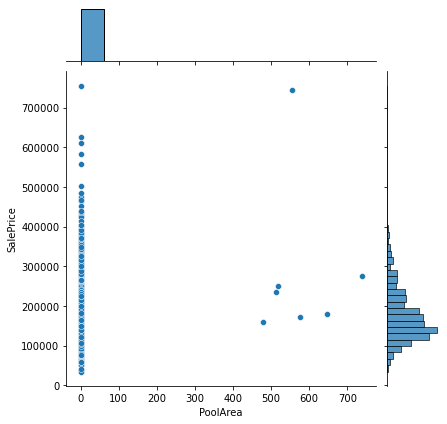

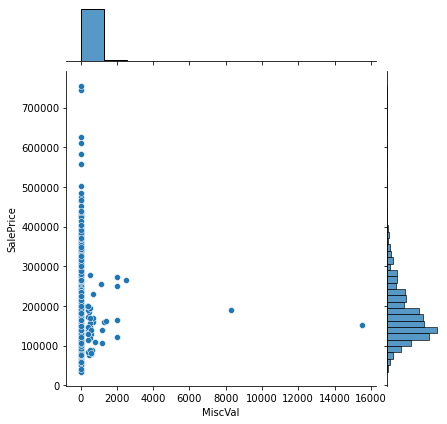

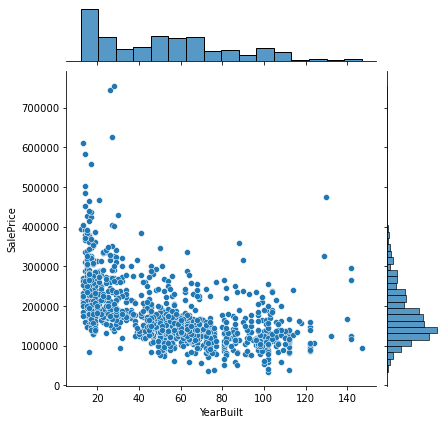

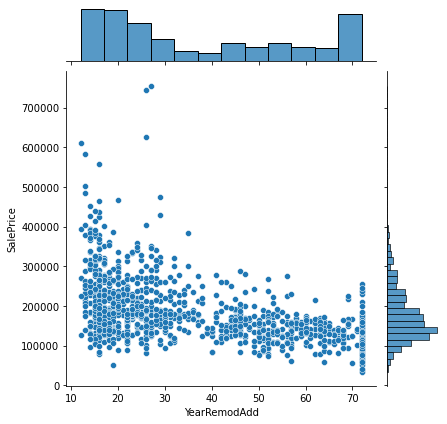

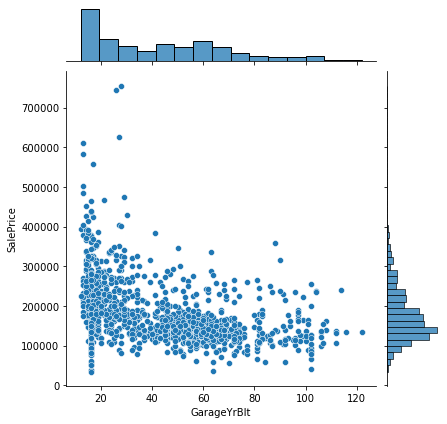

In [34]:
# NUMERICAL COLUMN ANALYSIS
for i, col in enumerate(num_col):
    num_col_analysis(i, col, out_col)

<Figure size 2160x1440 with 0 Axes>

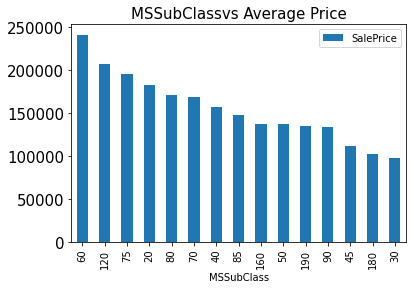

In [35]:
plt.figure(figsize=(30,20))
df15 = pd.DataFrame(df.groupby(['MSSubClass'])['SalePrice'].mean().sort_values(ascending = False))
df15.plot.bar()
plt.title('MSSubClassvs Average Price', fontsize=15)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=15)
plt.show()

(array([-100000.,       0.,  100000.,  200000.,  300000.,  400000.,
         500000.,  600000.,  700000.,  800000.,  900000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

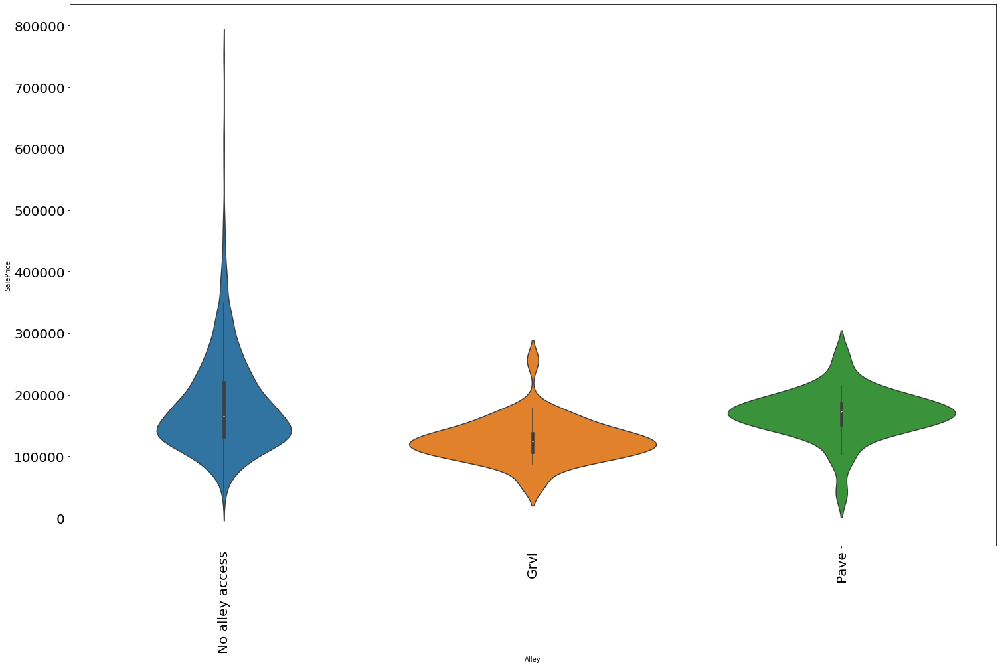

In [36]:
plt.figure(figsize=(25,15))
sns.violinplot(x=df['Alley'],y=df['SalePrice'])
plt.xticks(rotation=90,fontsize=20)
plt.yticks(fontsize=20)

<Figure size 2160x1440 with 0 Axes>

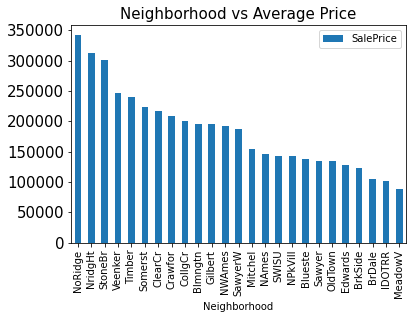

<Figure size 2160x1440 with 0 Axes>

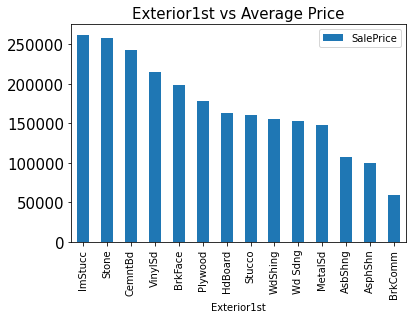

<Figure size 2160x1440 with 0 Axes>

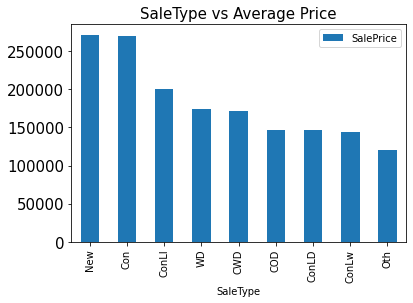

<Figure size 2160x1440 with 0 Axes>

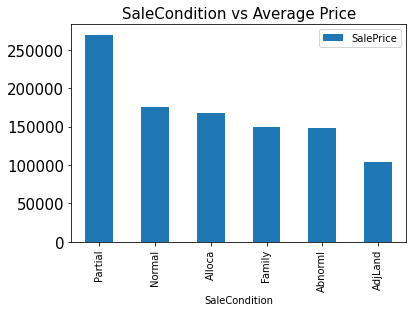

In [37]:
plt.figure(figsize=(30,20))
df9 = pd.DataFrame(df.groupby(['Neighborhood'])['SalePrice'].mean().sort_values(ascending = False))
df9.plot.bar()
plt.title('Neighborhood vs Average Price', fontsize=15)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=15)
plt.show()

plt.figure(figsize=(30,20))
df9 = pd.DataFrame(df.groupby(['Exterior1st'])['SalePrice'].mean().sort_values(ascending = False))
df9.plot.bar()
plt.title('Exterior1st vs Average Price', fontsize=15)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=15)
plt.show()

plt.figure(figsize=(30,20))
df9 = pd.DataFrame(df.groupby(['SaleType'])['SalePrice'].mean().sort_values(ascending = False))
df9.plot.bar()
plt.title('SaleType vs Average Price', fontsize=15)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=15)
plt.show()

plt.figure(figsize=(30,20))
df9 = pd.DataFrame(df.groupby(['SaleCondition'])['SalePrice'].mean().sort_values(ascending = False))
df9.plot.bar()
plt.title('SaleCondition vs Average Price', fontsize=15)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=15)
plt.show()

<Figure size 432x288 with 0 Axes>

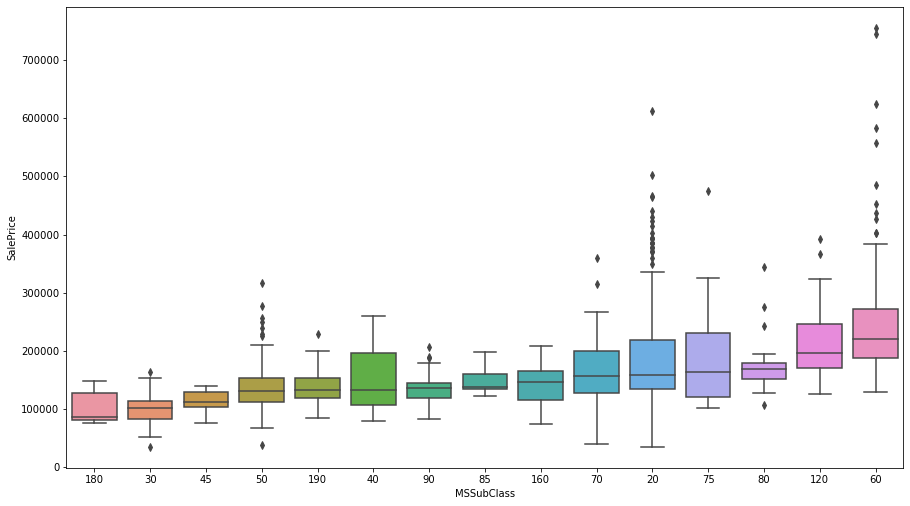

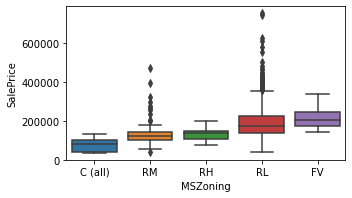

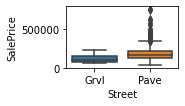

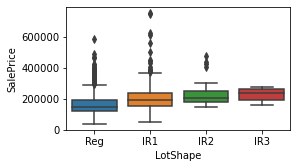

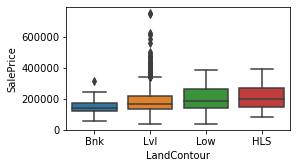

...

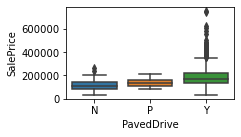

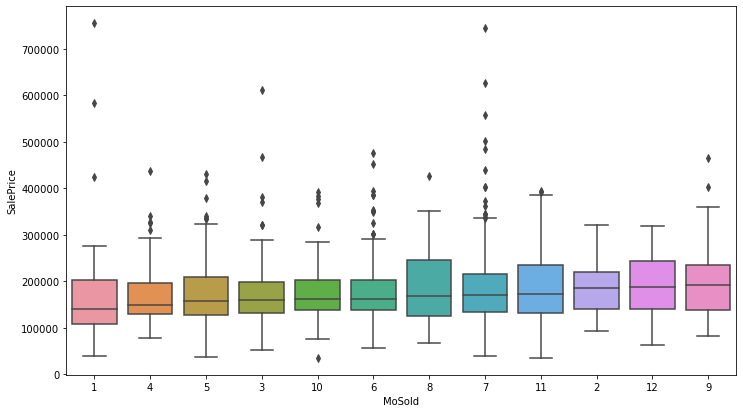

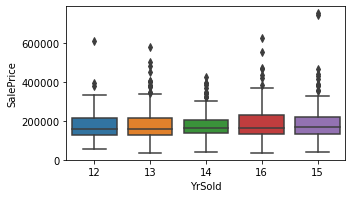

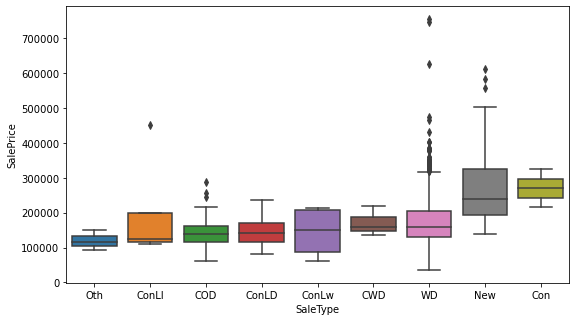

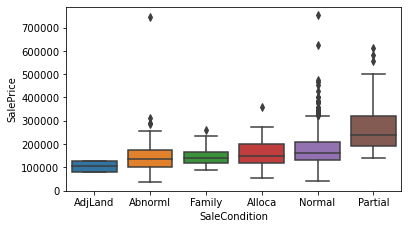

In [38]:
# CATEGORICAL COLUMN ANALYSIS
for i, col in enumerate(cat_col):
    cat_col_analysis(i, col, out_col)

array([[<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>],
       [<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>],
       [<AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Frequency'>,
        <AxesSubplot:ylabel='Fre

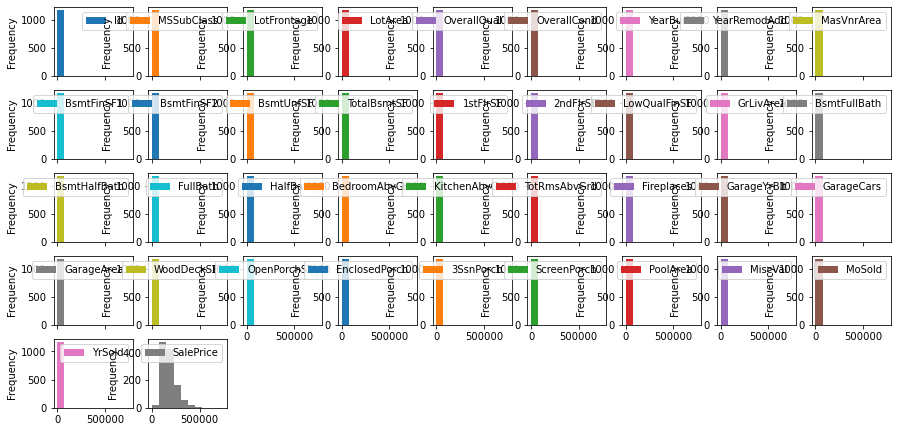

In [39]:
df.plot(kind="hist",subplots=True,layout=(10,9),figsize=(15,15))

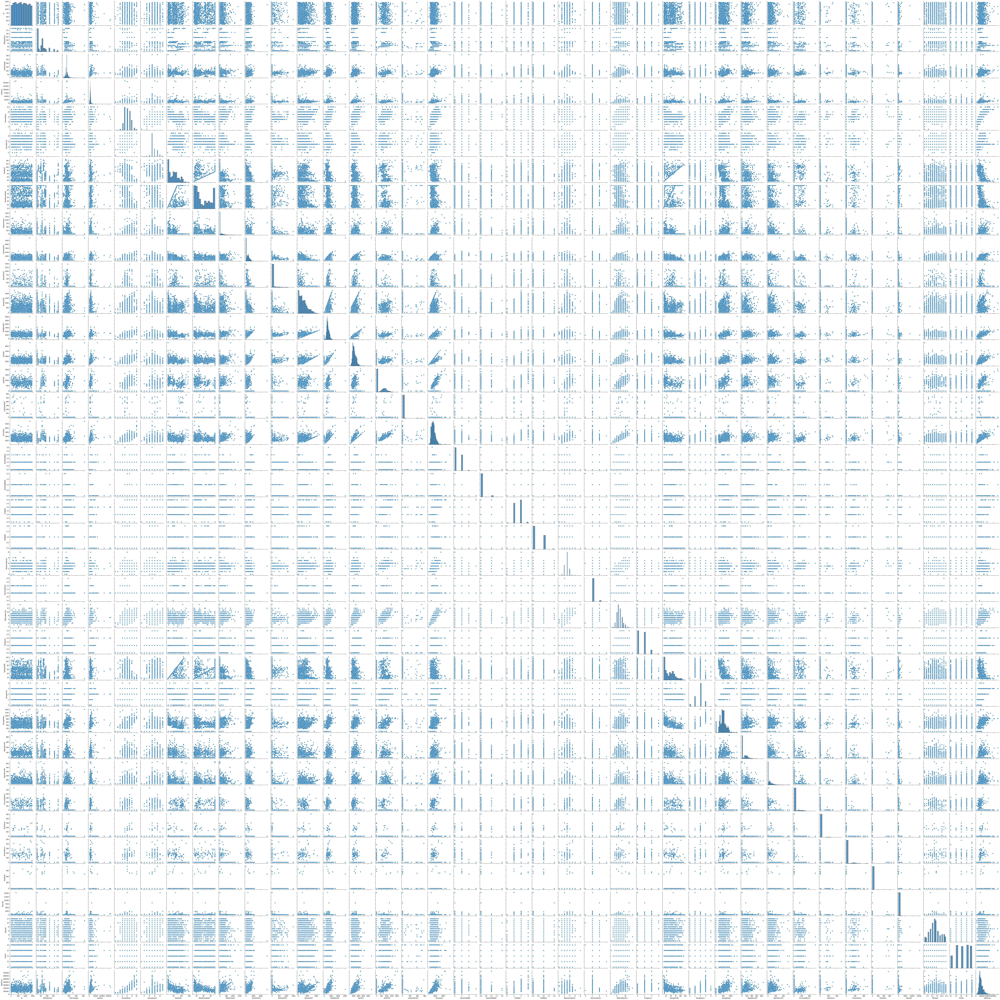

In [40]:
sns.pairplot(df)

In [41]:
#Coverting object data in float/Integer by using label Encoding  
le=LabelEncoder()
df["MSZoning"]=le.fit_transform(df["MSZoning"].astype(str))
df["Street"]=le.fit_transform(df["Street"].astype(str))
df["Alley"]=le.fit_transform(df["Alley"].astype(str))
df["LotShape"]=le.fit_transform(df["LotShape"].astype(str))
df["LandContour"]=le.fit_transform(df["LandContour"].astype(str))
df["Utilities"]=le.fit_transform(df["Utilities"].astype(str))
df["LotConfig"]=le.fit_transform(df["LotConfig"].astype(str))
df["LandSlope"]=le.fit_transform(df["LandSlope"].astype(str))
df["Neighborhood"]=le.fit_transform(df["Neighborhood"].astype(str))
df["Condition1"]=le.fit_transform(df["Condition1"].astype(str))
df["Condition2"]=le.fit_transform(df["Condition2"].astype(str))
df["BldgType"]=le.fit_transform(df["BldgType"].astype(str))
df["HouseStyle"]=le.fit_transform(df["HouseStyle"].astype(str))
df["RoofStyle"]=le.fit_transform(df["RoofStyle"].astype(str))
df["RoofMatl"]=le.fit_transform(df["RoofMatl"].astype(str))
df["Exterior1st"]=le.fit_transform(df["Exterior1st"].astype(str))
df["Exterior2nd"]=le.fit_transform(df["Exterior2nd"].astype(str))
df["MasVnrType"]=le.fit_transform(df["MasVnrType"].astype(str))
df["ExterQual"]=le.fit_transform(df["ExterQual"].astype(str))
df["ExterCond"]=le.fit_transform(df["ExterCond"].astype(str))
df["Foundation"]=le.fit_transform(df["Foundation"].astype(str))
df["BsmtQual"]=le.fit_transform(df["BsmtQual"].astype(str))
df["BsmtCond"]=le.fit_transform(df["BsmtCond"].astype(str))
df["BsmtExposure"]=le.fit_transform(df["BsmtExposure"].astype(str))
df["BsmtFinType1"]=le.fit_transform(df["BsmtFinType1"].astype(str))
df["BsmtFinType2"]=le.fit_transform(df["BsmtFinType2"].astype(str))
df["Heating"]=le.fit_transform(df["Heating"].astype(str))
df["HeatingQC"]=le.fit_transform(df["HeatingQC"].astype(str))
df["CentralAir"]=le.fit_transform(df["CentralAir"].astype(str))
df["Electrical"]=le.fit_transform(df["Electrical"].astype(str))
df["KitchenQual"]=le.fit_transform(df["KitchenQual"].astype(str))
df["Functional"]=le.fit_transform(df["Functional"].astype(str))
df["FireplaceQu"]=le.fit_transform(df["FireplaceQu"].astype(str))
df["GarageType"]=le.fit_transform(df["GarageType"].astype(str))
df["GarageFinish"]=le.fit_transform(df["GarageFinish"].astype(str))
df["GarageQual"]=le.fit_transform(df["GarageQual"].astype(str))
df["GarageCond"]=le.fit_transform(df["GarageCond"].astype(str))
df["PavedDrive"]=le.fit_transform(df["PavedDrive"].astype(str))
df["PoolQC"]=le.fit_transform(df["PoolQC"].astype(str))
df["Fence"]=le.fit_transform(df["Fence"].astype(str))
df["MiscFeature"]=le.fit_transform(df["MiscFeature"].astype(str))
df["SaleType"]=le.fit_transform(df["SaleType"].astype(str))
df["SaleCondition"]=le.fit_transform(df["SaleCondition"].astype(str))

In [42]:
#Checking skewness. SInce the skewness is not that much we can proceed further without removing.  
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3,70.98847,4928,1,1,0,3,0,4,0,13,2,2,4,2,6,5,46,46,1,1,8,9,2,0.0,3,4,1,2,4,4,0,120,6,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,5,1,45.0,2,2,440,5,5,2,0,205,0,0,0,0,3,4,1,0,2,15,8,4,128000
1,889,20,3,95.00000,15865,1,1,0,3,0,4,1,12,2,2,0,2,8,6,52,52,0,5,12,13,2,0.0,2,2,2,4,1,1,0,351,5,823,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,5,1,52.0,3,2,621,5,5,2,81,207,0,0,224,0,3,4,1,0,10,15,8,4,268000
2,793,60,3,92.00000,9920,1,1,0,3,0,1,0,15,2,2,0,5,7,5,26,25,1,1,7,7,2,0.0,2,4,2,2,4,0,2,862,6,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,5,1,25.0,3,2,455,5,5,2,180,130,0,0,0,0,3,4,1,0,6,15,8,4,269790
3,110,20,3,105.00000,11751,1,1,0,3,0,4,0,14,2,2,0,2,6,6,45,45,3,1,8,9,1,480.0,3,4,1,2,4,4,1,705,6,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,5,1,45.0,2,2,546,5,5,2,0,122,0,0,0,0,3,2,1,0,1,12,0,4,190000
4,422,20,3,70.98847,16635,1,1,0,3,0,2,0,14,2,2,0,2,6,7,45,22,1,1,4,4,3,126.0,2,4,1,2,4,4,0,1246,6,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,5,1,45.0,0,2,529,5,5,2,240,0,0,0,0,0,3,4,1,0,6,13,8,4,215000


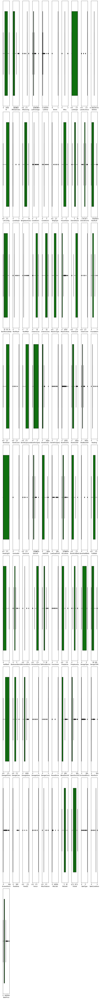

In [43]:
collist=df.columns.values
ncol=10
nrows=9
plt.figure(figsize=(ncol,10*ncol))
for i in range(0,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(df[collist[i]],color='green',orient='h')
    plt.tight_layout()

Id                 AxesSubplot(0.125,0.816017;0.0731132x0.0639831)
MSSubClass       AxesSubplot(0.212736,0.816017;0.0731132x0.0639...
MSZoning         AxesSubplot(0.300472,0.816017;0.0731132x0.0639...
LotFrontage      AxesSubplot(0.388208,0.816017;0.0731132x0.0639...
LotArea          AxesSubplot(0.475943,0.816017;0.0731132x0.0639...
Street           AxesSubplot(0.563679,0.816017;0.0731132x0.0639...
Alley            AxesSubplot(0.651415,0.816017;0.0731132x0.0639...
LotShape         AxesSubplot(0.739151,0.816017;0.0731132x0.0639...
LandContour      AxesSubplot(0.826887,0.816017;0.0731132x0.0639...
Utilities          AxesSubplot(0.125,0.739237;0.0731132x0.0639831)
LotConfig        AxesSubplot(0.212736,0.739237;0.0731132x0.0639...
LandSlope        AxesSubplot(0.300472,0.739237;0.0731132x0.0639...
Neighborhood     AxesSubplot(0.388208,0.739237;0.0731132x0.0639...
Condition1       AxesSubplot(0.475943,0.739237;0.0731132x0.0639...
Condition2       AxesSubplot(0.563679,0.739237;0.0731132x0.063

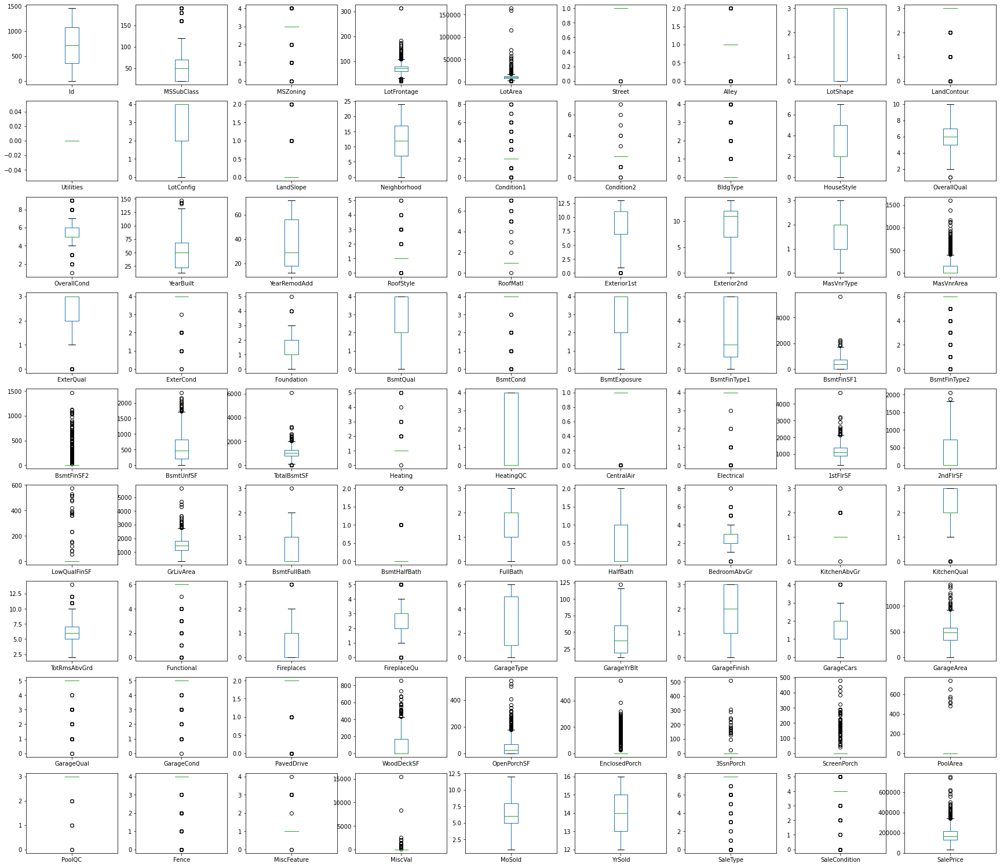

In [44]:
df.plot(kind="box",subplots=True,layout=(10,9),figsize=(30,30))

In [45]:
# IQR
Q1 = np.percentile(df['SalePrice'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df['SalePrice'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1
 
print("Old Shape: ", df.shape)
 
# Upper bound
upper = np.where(df['SalePrice'] >= (Q3+1.5*IQR))
# Lower bound
lower = np.where(df['SalePrice'] <= (Q1-1.5*IQR))
 
''' Removing the Outliers '''
df.drop(upper[0], inplace = True)
df.drop(lower[0], inplace = True)
 
print("New Shape: ", df.shape)

Old Shape:  (1168, 81)
New Shape:  (1123, 81)


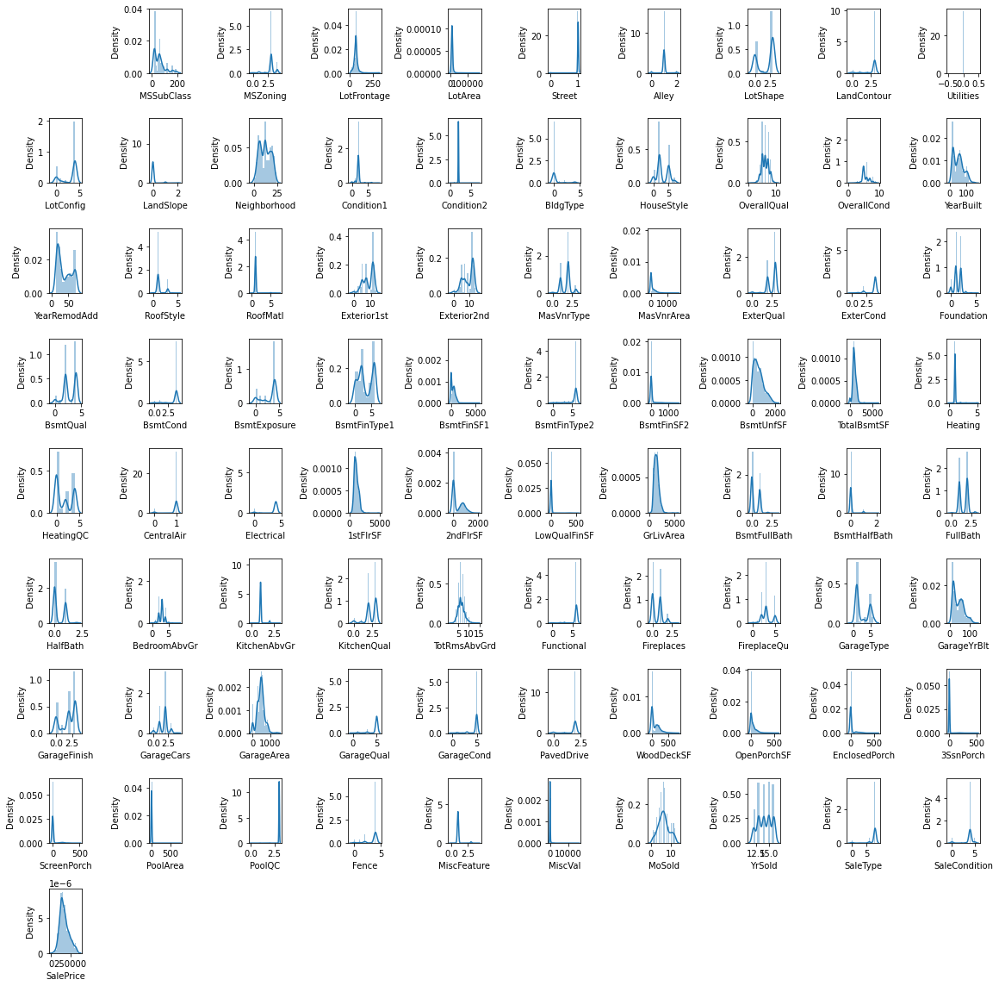

In [46]:
collist=df.columns.values
ncol=10
nrows=9
plt.figure(figsize=(16,16))
for i in range(1,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.distplot(df[collist[i]])
    plt.tight_layout()

In [47]:
y=df["SalePrice"]

In [48]:
df.drop("Id",axis=1,inplace=True)

In [49]:
x=df.iloc[:,0:-1]
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,120,3,70.98847,4928,1,1,0,3,0,4,0,13,2,2,4,2,6,5,46,46,1,1,8,9,2,0.0,3,4,1,2,4,4,0,120,6,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,5,1,45.0,2,2,440,5,5,2,0,205,0,0,0,0,3,4,1,0,2,15,8,4
1,20,3,95.00000,15865,1,1,0,3,0,4,1,12,2,2,0,2,8,6,52,52,0,5,12,13,2,0.0,2,2,2,4,1,1,0,351,5,823,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,5,1,52.0,3,2,621,5,5,2,81,207,0,0,224,0,3,4,1,0,10,15,8,4
2,60,3,92.00000,9920,1,1,0,3,0,1,0,15,2,2,0,5,7,5,26,25,1,1,7,7,2,0.0,2,4,2,2,4,0,2,862,6,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,5,1,25.0,3,2,455,5,5,2,180,130,0,0,0,0,3,4,1,0,6,15,8,4
3,20,3,105.00000,11751,1,1,0,3,0,4,0,14,2,2,0,2,6,6,45,45,3,1,8,9,1,480.0,3,4,1,2,4,4,1,705,6,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,5,1,45.0,2,2,546,5,5,2,0,122,0,0,0,0,3,2,1,0,1,12,0,4
4,20,3,70.98847,16635,1,1,0,3,0,2,0,14,2,2,0,2,6,7,45,22,1,1,4,4,3,126.0,2,4,1,2,4,4,0,1246,6,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,5,1,45.0,0,2,529,5,5,2,240,0,0,0,0,0,3,4,1,0,6,13,8,4


In [50]:
x.shape

(1123, 79)

In [51]:
d=x.columns
d

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'Wo

In [52]:
y.shape

(1123,)

In [53]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
x=scale.fit_transform(x)

In [54]:
x=pd.DataFrame(data=x, columns=d)
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1.481665,-0.019356,0.033445,-0.600926,0.059788,0.017006,-1.389916,0.316222,0.0,0.607148,-0.226798,0.169673,-0.034538,-0.017965,2.949140,-0.538047,0.004136,-0.541608,-0.206788,0.384327,-0.459025,-0.127584,-0.207839,-0.100549,0.416443,-0.554864,0.671448,0.373126,-0.527723,-0.679751,0.338126,0.661699,-1.398559,-0.689178,0.355079,-0.290636,0.913385,0.117058,-0.121487,1.353545,0.273205,0.305517,-0.505818,-0.796753,-0.124925,-1.088228,-0.796379,-0.235983,0.85008,-0.748008,-1.096988,-0.214236,0.803097,-0.950861,0.266691,0.644384,1.641712,-0.786617,0.074265,0.051265,0.370944,-0.115048,0.320062,0.301736,0.298127,-0.750337,2.448362,-0.369859,-0.121081,-0.271739,-0.072428,0.066875,0.479929,-0.189913,-0.088873,-1.612056,0.612623,0.312121,0.230667
1,-0.879161,-0.019356,1.124618,0.626330,0.059788,0.017006,-1.389916,0.316222,0.0,0.607148,3.262160,0.003260,-0.034538,-0.017965,-0.409769,-0.538047,1.552378,0.343728,-0.006250,0.672862,-1.692244,6.777305,1.085255,1.057570,0.416443,-0.554864,-0.964206,-2.287324,0.876620,0.988797,-2.707724,-1.268399,-1.398559,-0.160072,-0.462039,4.655860,1.108691,2.878758,-0.121487,-0.926216,0.273205,0.305517,2.971560,-0.796753,-0.124925,1.499178,1.131064,-0.235983,0.85008,-0.748008,1.391734,-0.214236,-0.527106,1.010835,0.266691,0.644384,1.641712,-0.786617,0.354400,0.910525,0.370944,0.765810,0.320062,0.301736,0.298127,-0.090296,2.478894,-0.369859,-0.121081,3.885192,-0.072428,0.066875,0.479929,-0.189913,-0.088873,1.366700,0.612623,0.312121,0.230667
2,0.065170,-0.019356,0.988287,-0.040767,0.059788,0.017006,-1.389916,0.316222,0.0,-1.215920,-0.226798,0.502498,-0.034538,-0.017965,-0.409769,1.034096,0.778257,-0.541608,-0.875248,-0.625544,-0.459025,-0.127584,-0.531113,-0.679609,0.416443,-0.554864,-0.964206,0.373126,0.876620,-0.679751,0.338126,-1.911764,-0.518188,1.010374,0.355079,-0.290636,-0.701908,0.211620,-0.121487,-0.926216,0.273205,0.305517,-0.039037,1.277916,-0.124925,1.079932,1.131064,-0.235983,0.85008,1.242545,0.147373,-0.214236,0.803097,1.010835,0.266691,0.644384,1.641712,-0.786617,-0.726119,0.910525,0.370944,-0.042049,0.320062,0.301736,0.298127,0.716422,1.303439,-0.369859,-0.121081,-0.271739,-0.072428,0.066875,0.479929,-0.189913,-0.088873,-0.122678,0.612623,0.312121,0.230667
3,-0.879161,-0.019356,1.579055,0.164693,0.059788,0.017006,-1.389916,0.316222,0.0,0.607148,-0.226798,0.336085,-0.034538,-0.017965,-0.409769,-0.538047,0.004136,0.343728,-0.240211,0.336238,2.007412,-0.127584,-0.207839,-0.100549,-1.259777,2.409101,0.671448,0.373126,-0.527723,-0.679751,0.338126,0.661699,-0.958373,0.650765,0.355079,-0.290636,1.329272,1.974356,-0.121487,-0.926216,0.273205,0.305517,1.941328,-0.796753,-0.124925,0.732615,-0.796379,-0.235983,0.85008,-0.748008,0.147373,-0.214236,0.803097,0.356937,0.266691,0.644384,1.641712,-0.786617,0.074265,0.051265,0.370944,0.400813,0.320062,0.301736,0.298127,-0.750337,1.181314,-0.369859,-0.121081,-0.271739,-0.072428,0.066875,-1.301759,-0.189913,-0.088873,-1.984400,-1.645502,-4.590146,0.230667
4,-0.879161,-0.019356,0.033445,0.712733,0.059788,0.017006,-1.389916,0.316222,0.0,-0.608231,-0.226798,0.336085,-0.034538,-0.017965,-0.409769,-0.538047,0.004136,1.229065,-0.240211,-0.7

In [55]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.33,random_state=42)

In [56]:
x_train.shape,y_train.shape,x_test.shape,y_test.shape

((752, 79), (752,), (371, 79), (371,))

Feature: 0, Score: 0.00000
Feature: 1, Score: 10.30192
Feature: 2, Score: 7.18075
Feature: 3, Score: 0.00000
Feature: 4, Score: 0.00000
Feature: 5, Score: -0.00000
Feature: 6, Score: -0.00000
Feature: 7, Score: 32.12552
Feature: 8, Score: 9.42760
Feature: 9, Score: 58.28694


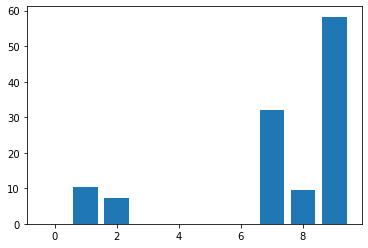

In [57]:
# linear regression feature importance
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot
x, y = make_regression(n_samples=1000, n_features=10, n_informative=5, random_state=42)
model = LinearRegression()
# fit the model
model.fit(x, y)
# get importance
importance = model.coef_
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [58]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'fit_intercept': [True],
    'normalize': [False],
    'copy_X': [True],
    'positive': [False]
}
# Create a based model
lm=LinearRegression()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = lm, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
grid_search.fit(x_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 1 candidates, totalling 3 fits


{'copy_X': True, 'fit_intercept': True, 'normalize': False, 'positive': False}

In [59]:
def evaluate(lm, x_test, y_test):
    predictions = lm.predict(x_test)
    errors = abs(predictions - y_test)
    mape = 100 * np.mean(errors / y_test)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
        
    return accuracy

base_model = LinearRegression()
base_model.fit(x_train, y_train)
base_accuracy = evaluate(base_model, x_test, y_test)

# Fit the grid search to the data
grid_search.fit(x_train,y_train)
grid_search.best_params_
{'fit_intercept': [True],
'normalize': [False],
'copy_X': [True],
'positive': [False]}
best_grid = grid_search.best_estimator_
grid_accuracy = evaluate(best_grid, x_test,y_test)
print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))

Model Performance
Average Error: 17737.4297 degrees.
Accuracy = 88.83%.
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Model Performance
Average Error: 17737.4297 degrees.
Accuracy = 88.83%.
Improvement of 0.00%.


In [60]:
lm=LinearRegression(fit_intercept= True, normalize=False,copy_X=True,positive=False)

In [61]:
lm.fit(x_train,y_train)

LinearRegression(normalize=False)

In [62]:
lm.coef_

array([-3.06128171e+03, -1.58458988e+03,  3.08929547e+03,  5.14973660e+03,
        2.67224401e+03, -2.24105325e+02, -2.25330404e+02, -4.18356211e+02,
        3.39523622e+15, -2.94562500e+02, -5.63437500e+02, -9.68500000e+02,
        4.22146484e+02,  5.32968750e+02, -3.51312500e+02,  5.08281250e+02,
        1.20643594e+04,  5.28912500e+03, -6.68212500e+03, -1.22232031e+03,
        5.78250000e+02, -1.18071875e+03, -3.03812500e+03,  1.04534375e+03,
        2.56812500e+03,  2.72118750e+03, -3.63575000e+03,  1.24296875e+03,
        1.38800000e+03, -2.33562500e+03, -2.75312500e+01, -1.57600000e+03,
       -9.70410156e+02,  4.54385446e+15,  9.14140625e+02,  1.73163785e+15,
        4.52959104e+15, -4.29242002e+15,  1.42023438e+02, -1.22359375e+03,
        1.85962500e+03, -1.43350000e+03,  8.02812631e+15,  9.46945939e+15,
        1.08742568e+15, -1.07895056e+16,  2.18125000e+03, -2.75023438e+02,
        2.20593750e+02, -1.70000000e+01, -2.22925000e+03, -2.20493750e+03,
       -4.37850000e+03,  

In [63]:
lm.intercept_

172301.4727393617

In [64]:
lm.score(x_train,y_train)

0.9088208448110829

In [65]:
pred=lm.predict(x_test)

In [66]:
print("error:")

print("mean absolute error:",mean_absolute_error(y_test,pred))
print("men squared error:",mean_squared_error(y_test,pred))
print("root mean squared error:", np.sqrt(mean_squared_error(y_test,pred)))

error:
mean absolute error: 17737.429660581412
men squared error: 1739144103.174415
root mean squared error: 41703.04668935371


In [67]:
from sklearn.metrics import r2_score
print(r2_score(y_test,pred))

0.4923024006875495


0.9088206541401964
[-3.06767715e+03 -1.58225432e+03  3.09200772e+03  5.15145819e+03
  2.67579871e+03 -2.19537728e+02 -2.23730568e+02 -4.20106141e+02
  0.00000000e+00 -2.96903200e+02 -5.64725069e+02 -9.66987714e+02
  4.22565413e+02  5.32567003e+02 -3.47768114e+02  5.06180602e+02
  1.20607512e+04  5.28677279e+03 -6.67711514e+03 -1.22574521e+03
  5.78086341e+02 -1.18291897e+03 -3.03337752e+03  1.03865527e+03
  2.56688705e+03  2.72084607e+03 -3.63436212e+03  1.24449557e+03
  1.38848607e+03 -2.33188230e+03 -2.83271264e+01 -1.57927270e+03
 -9.68744532e+02  9.06849423e+03  9.17505098e+02  2.53746741e+03
  3.73433649e+03  3.07520461e+03  1.39355748e+02 -1.22147024e+03
  1.86116116e+03 -1.43391698e+03  1.42699092e+04  1.80275625e+04
  3.52531261e+01  3.82255802e+03  2.18161191e+03 -2.73918440e+02
  2.22957621e+02 -1.77071849e+01 -2.23216049e+03 -2.20544422e+03
 -4.38294157e+03  8.90082315e+02  2.65136093e+03  2.87430729e+03
 -5.85285011e+02  1.65188395e+03 -2.50713453e+02 -2.64741079e+03
  1.80

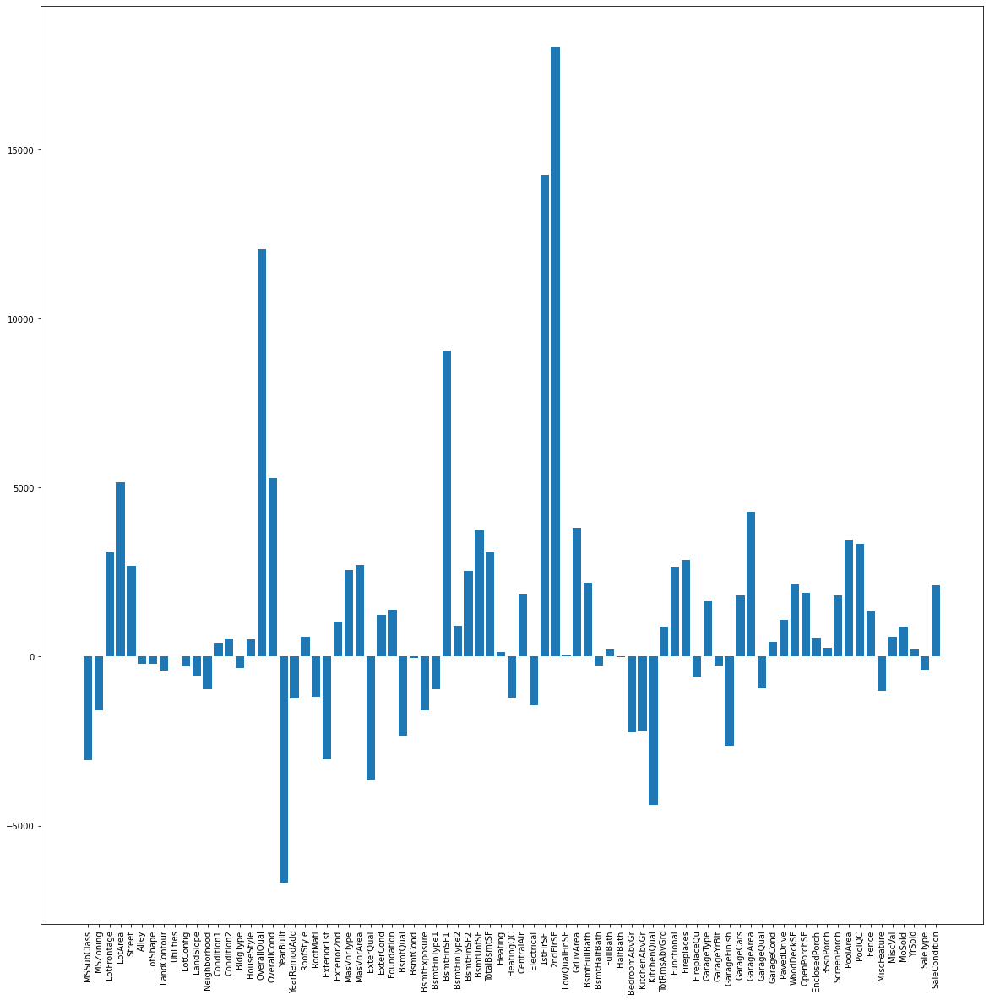

In [111]:
from sklearn.linear_model import Lasso,Ridge
ls=Lasso(alpha=0.0001)
ls.fit(x_train,y_train)
print(ls.score(x_train,y_train))
print(ls.coef_)
plt.figure(figsize=(20,20))
plt.bar(d,ls.coef_)
plt.xticks(rotation=90)
plt.show()

0.9088206541401836
[-3067.67481242 -1582.25390276  3092.00701322  5151.45667721
  2675.79832087  -219.53718101  -223.73104344  -420.10633753
     0.          -296.90336798  -564.72425033  -966.98719549
   422.56485883   532.56700137  -347.76980322   506.1803583
 12060.74934505  5286.77123538 -6677.10646281 -1225.74667336
   578.08698431 -1182.91782887 -3033.37587538  1038.65389439
  2566.88666082  2720.84681903 -3634.36264917  1244.49602124
  1388.48727702 -2331.88306302   -28.32736272 -1579.27311693
  -968.74532938  5488.22023765   917.50516998  1173.04525333
   165.30254016  6457.36359624   139.35590695 -1221.47065801
  1861.16139301 -1433.91671948  7058.74259634  9521.73414726
  -941.51395205 13514.08756345  2181.61268033  -273.91922989
   222.96196347   -17.70409697 -2232.15863878 -2205.44536486
 -4382.94173304   890.08761862  2651.36072831  2874.30870201
  -585.28479048  1651.88218698  -250.71483813 -2647.41159229
  1802.01302782  4281.76362505  -944.61868652   430.91357522
  1075

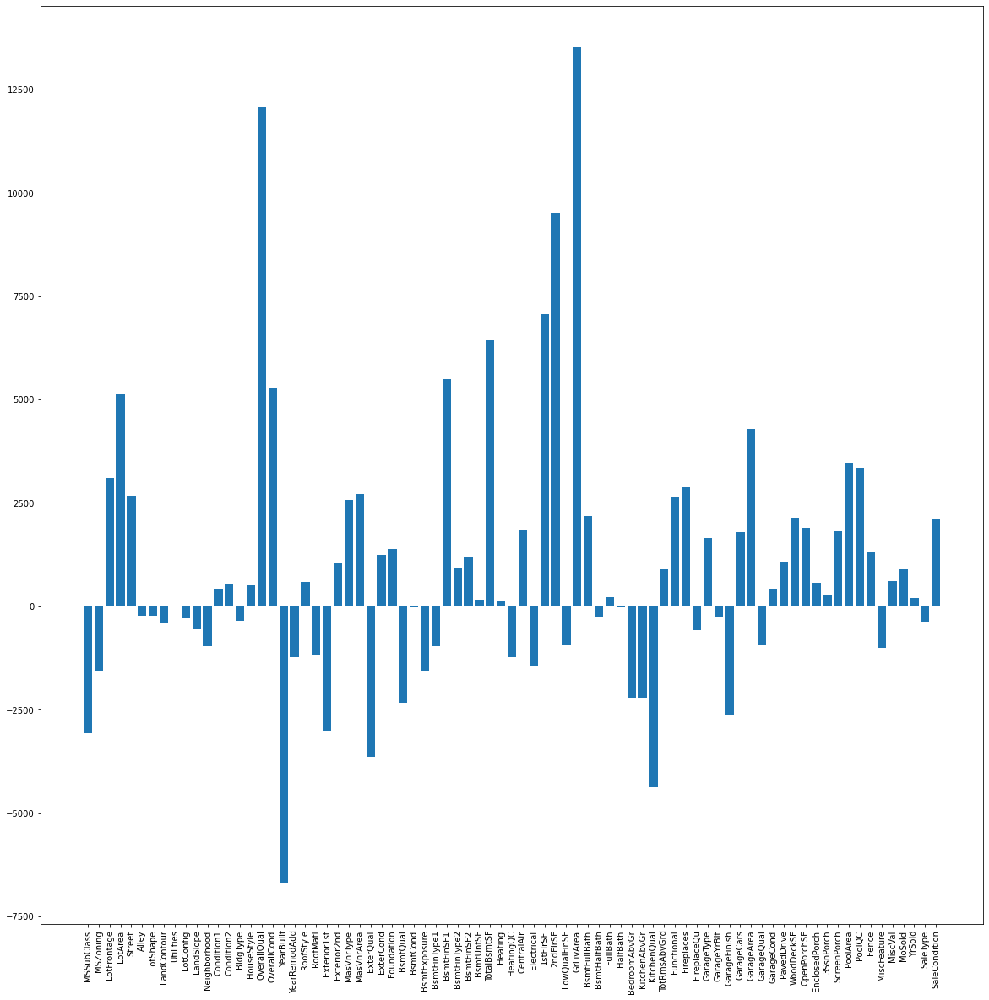

In [112]:
rs=Ridge(alpha=0.0001)
rs.fit(x_train,y_train)
print(rs.score(x_train,y_train))
print(rs.coef_)
plt.figure(figsize=(20,20))
plt.bar(d,rs.coef_)
plt.xticks(rotation=90)
plt.show()

0.908820653098408
[-3.06689208e+03 -1.58213123e+03  3.09151197e+03  5.15073969e+03
  2.67555634e+03 -2.19393505e+02 -2.23887732e+02 -4.20119079e+02
  0.00000000e+00 -2.96943617e+02 -5.64462191e+02 -9.66790992e+02
  4.22446548e+02  5.32588676e+02 -3.48453937e+02  5.06128298e+02
  1.20596475e+04  5.28621090e+03 -6.67435896e+03 -1.22627417e+03
  5.78207035e+02 -1.18266802e+03 -3.03233285e+03  1.03778878e+03
  2.56672413e+03  2.72087936e+03 -3.63447741e+03  1.24467141e+03
  1.38885242e+03 -2.33223586e+03 -2.82810440e+01 -1.57941941e+03
 -9.68882912e+02  8.68027041e+03  9.17367534e+02  2.38948485e+03
  3.34744757e+03  3.44213263e+03  1.39370349e+02 -1.22156459e+03
  1.86122004e+03 -1.43367849e+03  1.35297179e+04  1.71535318e+04
 -6.53566703e+01  4.81631177e+03  2.18152739e+03 -2.74194655e+02
  2.23725773e+02 -1.69389112e+01 -2.23157872e+03 -2.20572766e+03
 -4.38288100e+03  8.90498007e+02  2.65148526e+03  2.87451310e+03
 -5.85234763e+02  1.65111085e+03 -2.51355585e+02 -2.64754312e+03
  1.802

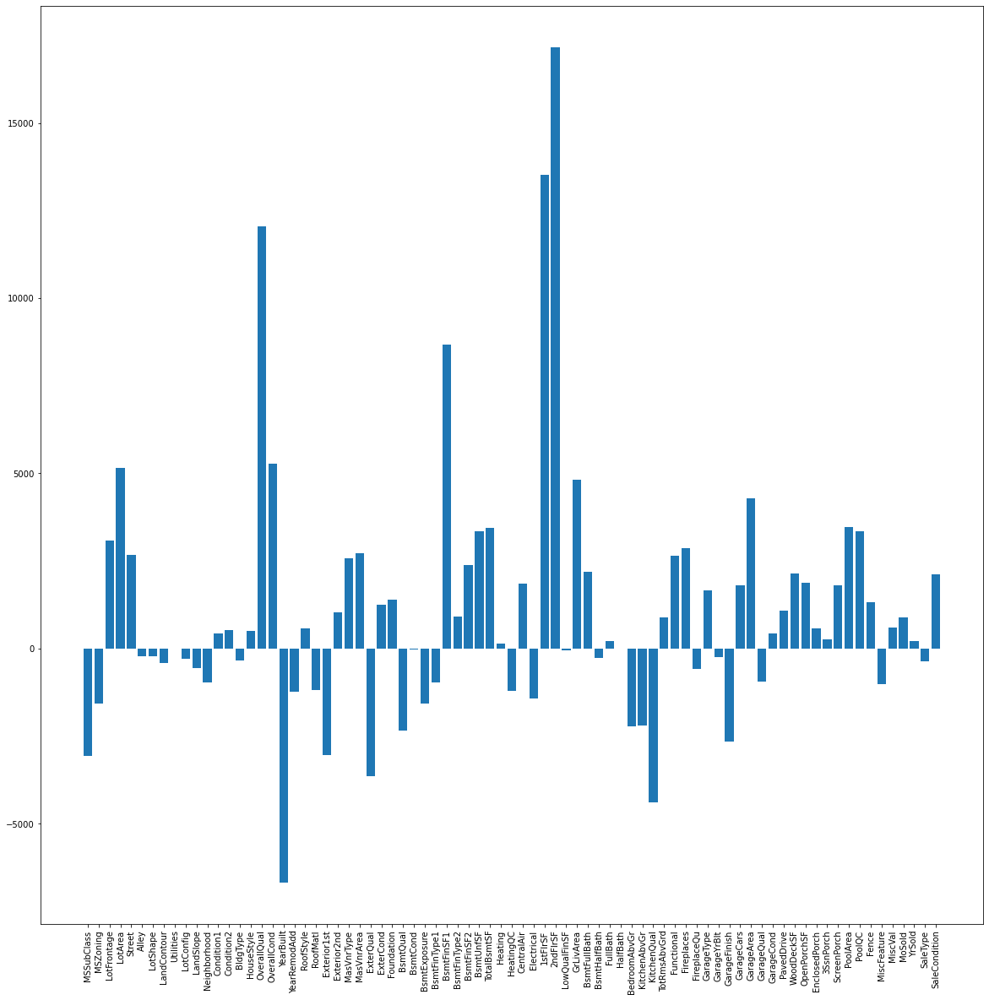

In [113]:
from sklearn.linear_model import ElasticNet
enr=ElasticNet(alpha=.0001)
enr.fit(x_train,y_train)
print(enr.score(x_train,y_train))
print(enr.coef_)
plt.figure(figsize=(20,20))
plt.bar(d,enr.coef_)
plt.xticks(rotation=90)
plt.show()

In [114]:
from sklearn.svm import SVR
kernellist=['linear','poly','rbf']
for i in kernellist:
    sv=SVR(kernel=i)
    sv.fit(x_train,y_train)
    print(sv.score(x_train,y_train))

0.11236360957598468
-0.03931970071155866
-0.039037410753138824


Feature: 0, Score: 0.00287
Feature: 1, Score: 0.02182
Feature: 2, Score: 0.00770
Feature: 3, Score: 0.00165
Feature: 4, Score: 0.00215
Feature: 5, Score: 0.00399
Feature: 6, Score: 0.00320
Feature: 7, Score: 0.21933
Feature: 8, Score: 0.00999
Feature: 9, Score: 0.72728


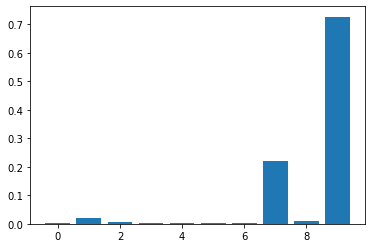

In [115]:
# decision tree for feature importance on a regression problem
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor
from matplotlib import pyplot
# define dataset
x, y = make_regression(n_samples=1000, n_features=10, n_informative=5, random_state=42)
# define the model
model = DecisionTreeRegressor()
# fit the model
model.fit(x, y)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [116]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'criterion':['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'splitter':['best', 'random'],
    'min_samples_split': [2,4,6,8,10,12],
    'min_samples_leaf': [1,2,3,4,5],
    'max_features':['auto', 'sqrt', 'log2']
}
# Create a based model
dtc=DecisionTreeRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = dtc, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
grid_search.fit(x_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 720 candidates, totalling 2160 fits


{'criterion': 'absolute_error',
 'max_features': 'auto',
 'min_samples_leaf': 5,
 'min_samples_split': 8,
 'splitter': 'best'}

In [117]:
def evaluate(dtc, x_test, y_test):
    predictions = dtc.predict(x_test)
    errors = abs(predictions - y_test)
    mape = 100 * np.mean(errors / y_test)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
        
    return accuracy

base_model = DecisionTreeRegressor()
base_model.fit(x_train, y_train)
base_accuracy = evaluate(base_model, x_test, y_test)

# Fit the grid search to the data
grid_search.fit(x_train,y_train)
grid_search.best_params_
{'criterion': 'absolute_error',
 'max_features': 'auto',
 'min_samples_leaf': 5,
 'min_samples_split': 4,
 'splitter': 'best'}
best_grid = grid_search.best_estimator_
grid_accuracy = evaluate(best_grid, x_test,y_test)
print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))

Model Performance
Average Error: 25434.4771 degrees.
Accuracy = 83.70%.
Fitting 3 folds for each of 720 candidates, totalling 2160 fits
Model Performance
Average Error: 22776.6954 degrees.
Accuracy = 85.90%.
Improvement of 2.62%.


In [118]:
dtc=DecisionTreeRegressor(criterion='absolute_error',max_features='auto', min_samples_leaf= 5,min_samples_split=4,splitter='best')
dtc.fit(x_train,y_train)
print("DTC SCORE:",dtc.score(x_train,y_train))
dtcpredict=dtc.predict(x_test)
print("dtc r2_score:",r2_score(y_test,dtcpredict))
print("mean squared error of DTC:",mean_squared_error(y_test,dtcpredict))
print("root mean squared error of DTC:",np.sqrt(mean_squared_error(y_test,dtcpredict)))

DTC SCORE: 0.9243785998246453
dtc r2_score: 0.709383489655588
mean squared error of DTC: 995521725.7971698
root mean squared error of DTC: 31551.88941723094


Feature: 0, Score: 31.04736
Feature: 1, Score: 144.01398
Feature: 2, Score: 88.26493
Feature: 3, Score: 45.44760
Feature: 4, Score: 20.24958
Feature: 5, Score: 43.40160
Feature: 6, Score: 50.55495
Feature: 7, Score: 1096.69069
Feature: 8, Score: 141.53839
Feature: 9, Score: 3909.85532


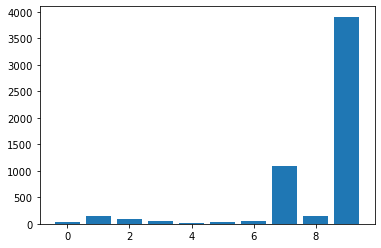

In [119]:
# permutation feature importance with knn for regression
from sklearn.datasets import make_regression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance
from matplotlib import pyplot
# define dataset
x, y = make_regression(n_samples=1000, n_features=10, n_informative=5, random_state=42)
# define the model
model = KNeighborsRegressor()
# fit the model
model.fit(x, y)
# perform permutation importance
results = permutation_importance(model, x, y, scoring='neg_mean_squared_error')
# get importance
importance = results.importances_mean
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [120]:
knr=KNeighborsRegressor()
knr.fit(x_train,y_train)
print("KNR SCORE:",knr.score(x_train,y_train))
knrpredict=knr.predict(x_test)
print("KNN r2_score:",r2_score(y_test,knrpredict))
print("mean squared error of DTC:",mean_squared_error(y_test,knrpredict))
print("root mean squared error of DTC:",np.sqrt(mean_squared_error(y_test,knrpredict)))

KNR SCORE: 0.8530832024232051
KNN r2_score: 0.7479989420174742
mean squared error of DTC: 863242517.9428573
root mean squared error of DTC: 29380.98905657972


In [121]:
svr1=SVR()
svr1.fit(x_train,y_train)
print("SVR1 SCORE:",svr1.score(x_train,y_train))

svr1predict=svr1.predict(x_test)
print("SVR r2_score:",r2_score(y_test,svr1predict))
print("mean squared error of SVR:",mean_squared_error(y_test,svr1predict))
print("root mean squared error of SVR:",np.sqrt(mean_squared_error(y_test,svr1predict)))

SVR1 SCORE: -0.039037410753138824
SVR r2_score: -0.041567457547686315
mean squared error of SVR: 3567942618.412149
root mean squared error of SVR: 59732.25777092432


Feature: 0, Score: 0.00362
Feature: 1, Score: 0.01535
Feature: 2, Score: 0.00610
Feature: 3, Score: 0.00271
Feature: 4, Score: 0.00306
Feature: 5, Score: 0.00359
Feature: 6, Score: 0.00334
Feature: 7, Score: 0.21167
Feature: 8, Score: 0.01111
Feature: 9, Score: 0.73944


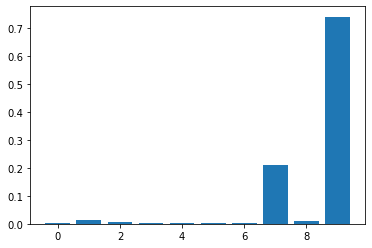

In [122]:
# random forest for feature importance on a regression problem
from sklearn.datasets import make_regression
from sklearn.ensemble import RandomForestRegressor
from matplotlib import pyplot
# define dataset
x, y = make_regression(n_samples=1000, n_features=10, n_informative=5, random_state=42)
# define the model
model = RandomForestRegressor()
# fit the model
model.fit(x, y)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [123]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
grid_search.fit(x_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits


{'bootstrap': True,
 'max_depth': 110,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 1000}

In [124]:
def evaluate(rf, x_test, y_test):
    predictions = rf.predict(x_test)
    errors = abs(predictions - y_test)
    mape = 100 * np.mean(errors / y_test)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
        
    return accuracy

base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(x_train, y_train)
base_accuracy = evaluate(base_model, x_test, y_test)

# Fit the grid search to the data
grid_search.fit(x_train,y_train)
grid_search.best_params_
{'bootstrap': True,
 'max_depth': 110,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 1000}
best_grid = grid_search.best_estimator_
grid_accuracy = evaluate(best_grid, x_test,y_test)
print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))

Model Performance
Average Error: 17767.3539 degrees.
Accuracy = 88.90%.
Fitting 3 folds for each of 288 candidates, totalling 864 fits
Model Performance
Average Error: 19246.6267 degrees.
Accuracy = 87.78%.
Improvement of -1.26%.


In [125]:
rf=RandomForestRegressor(n_estimators=1000,random_state=42,bootstrap=True,max_depth=110,max_features=3,min_samples_leaf=3,min_samples_split=8) # default(n_estimators=100) for RandomForestClassifier
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
print("rf score:",rf.score(x_train,y_train))
print("rf r2 score:",r2_score(y_test,predrf))
print("mean squared error of RF:",mean_squared_error(y_test,predrf))
print("root mean squared error of RF:",np.sqrt(mean_squared_error(y_test,predrf)))

rf score: 0.8944881670026115
rf r2 score: 0.7872622031285106
mean squared error of RF: 728744208.0727093
root mean squared error of RF: 26995.26269686423


In [126]:
#AdaBoostRegressor(base_estimator=DecisionTreeClassifier(),n_estimators=50,Learning_rate=1.0)
ad=AdaBoostRegressor(n_estimators=50,random_state=42)
ad.fit(x_train,y_train)
predad=ad.predict(x_test)
print("ABR score:",ad.score(x_train,y_train))
print("ABR r2 score:",r2_score(y_test,predad))
print("mean squared error of ABR:",mean_squared_error(y_test,predad))
print("root mean squared error of ABR:",np.sqrt(mean_squared_error(y_test,predad)))

ABR score: 0.8934327434593301
ABR r2 score: 0.7985672710843128
mean squared error of ABR: 690018119.3578016
root mean squared error of ABR: 26268.195966944542


In [127]:
gb=GradientBoostingRegressor()
gb.fit(x_train,y_train)
predgb=gb.predict(x_test)
print("GBR score:",gb.score(x_train,y_train))
print("GBR r2 score:",r2_score(y_test,predgb))
print("mean squared error of GBR:",mean_squared_error(y_test,predad))
print("root mean squared error of GBR:",np.sqrt(mean_squared_error(y_test,predad)))

GBR score: 0.9715308104507098
GBR r2 score: 0.8078553279271397
mean squared error of GBR: 690018119.3578016
root mean squared error of GBR: 26268.195966944542


Text(0, 0.5, 'predict_Price')

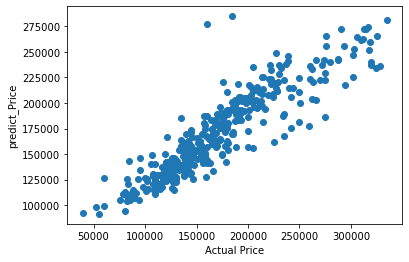

In [128]:
plt.scatter(x=y_test,y=predrf)
plt.xlabel("Actual Price")
plt.ylabel("predict_Price")

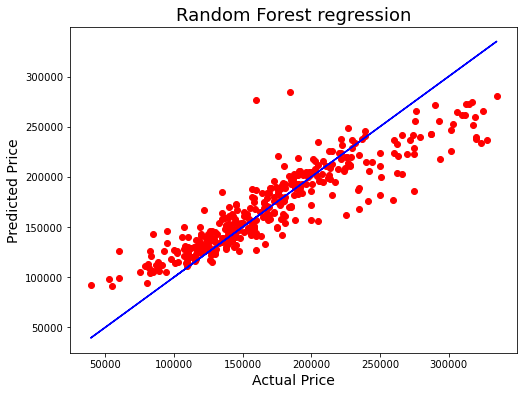

In [129]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test, y=predrf, color='r')
plt.plot(y_test, y_test, color='b')
plt.xlabel('Actual Price',fontsize=14)
plt.ylabel('Predicted Price',fontsize=14)
plt.title('Random Forest regression',fontsize=18)
plt.show()

# Lets Predict the value of the Test Data

In [130]:
df1.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,120,3,70.98847,4928,1,1,0,3,0,4,0,13,2,2,4,2,6,5,46,46,1,1,8,9,2,0.0,3,4,1,2,4,4,0,120,6,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,5,1,45.0,2,2,440,5,5,2,0,205,0,0,0,0,3,4,1,0,2,15,8,4
1,20,3,95.00000,15865,1,1,0,3,0,4,1,12,2,2,0,2,8,6,52,52,0,5,12,13,2,0.0,2,2,2,4,1,1,0,351,5,823,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,5,1,52.0,3,2,621,5,5,2,81,207,0,0,224,0,3,4,1,0,10,15,8,4
2,60,3,92.00000,9920,1,1,0,3,0,1,0,15,2,2,0,5,7,5,26,25,1,1,7,7,2,0.0,2,4,2,2,4,0,2,862,6,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,5,1,25.0,3,2,455,5,5,2,180,130,0,0,0,0,3,4,1,0,6,15,8,4
3,20,3,105.00000,11751,1,1,0,3,0,4,0,14,2,2,0,2,6,6,45,45,3,1,8,9,1,480.0,3,4,1,2,4,4,1,705,6,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,5,1,45.0,2,2,546,5,5,2,0,122,0,0,0,0,3,2,1,0,1,12,0,4
4,20,3,70.98847,16635,1,1,0,3,0,2,0,14,2,2,0,2,6,7,45,22,1,1,4,4,3,126.0,2,4,1,2,4,4,0,1246,6,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,5,1,45.0,0,2,529,5,5,2,240,0,0,0,0,0,3,4,1,0,6,13,8,4


In [131]:
df1.drop("Id",axis=1,inplace=True)

KeyError: "['Id'] not found in axis"

In [ ]:
#Checking the null value-No null value found 
df1.isnull().sum()

In [ ]:
#Since there are two types of "No info" data. we have to get this convereted into 
df1["LotFrontage"].fillna(value=df1["LotFrontage"].mean(), inplace=True)

In [ ]:
#Since there are two types of "No info" data. we have to get this convereted into one. 
df1['Alley'].fillna("No alley access", inplace=True)

In [ ]:
#Since there are two types of "No info" data. we have to get this convereted into one. 
df1['MasVnrType'].fillna("None", inplace=True)
df1['MasVnrArea'].fillna(0, inplace=True)

In [ ]:
#Since there are two types of "No info" data. we have to get this convereted into one. 
df1['BsmtQual'].fillna("NA", inplace=True)
df1['BsmtCond'].fillna("NA", inplace=True)
df1['BsmtExposure'].fillna("NA", inplace=True)
df1['BsmtFinType1'].fillna("NA", inplace=True)
df1['BsmtFinType2'].fillna("NA", inplace=True)
df1['Electrical'].fillna("Mix", inplace=True)

In [ ]:
df1['FireplaceQu'].fillna("NA", inplace=True)
df1['GarageType'].fillna("NA", inplace=True)

In [ ]:
most_value=df["GarageYrBlt"].mode().iloc[0]
#Since there are two types of "No info" data. we have to get this convereted into 
df1["GarageYrBlt"].fillna(value=most_value, inplace=True)

In [ ]:
df1['GarageFinish'].fillna("NA", inplace=True)

In [ ]:
df1['GarageQual'].fillna("NA", inplace=True)

In [ ]:
df1['GarageCond'].fillna("NA", inplace=True)

In [ ]:
df1['PoolQC'].fillna("NA", inplace=True)

In [ ]:
df1['Fence'].fillna("NA", inplace=True)

In [ ]:
df1['MiscFeature'].fillna("NA", inplace=True)

In [ ]:
df1.isnull().sum()

In [ ]:
#converting year to number of years
df1['YearBuilt'] = pd.datetime.now().year-df1['YearBuilt']
df1['YearRemodAdd']=pd.datetime.now().year-df1['YearRemodAdd']
df1['GarageYrBlt']=pd.datetime.now().year-df1['GarageYrBlt']
df1['YrSold'] = pd.datetime.now().year-df1['YrSold']

In [ ]:
#Coverting object data in float/Integer by using label Encoding  
le=LabelEncoder()
df1["MSZoning"]=le.fit_transform(df1["MSZoning"].astype(str))
df1["Street"]=le.fit_transform(df1["Street"].astype(str))
df1["Alley"]=le.fit_transform(df1["Alley"].astype(str))
df1["LotShape"]=le.fit_transform(df1["LotShape"].astype(str))
df1["LandContour"]=le.fit_transform(df1["LandContour"].astype(str))
df1["Utilities"]=le.fit_transform(df1["Utilities"].astype(str))
df1["LotConfig"]=le.fit_transform(df1["LotConfig"].astype(str))
df1["LandSlope"]=le.fit_transform(df1["LandSlope"].astype(str))
df1["Neighborhood"]=le.fit_transform(df1["Neighborhood"].astype(str))
df1["Condition1"]=le.fit_transform(df1["Condition1"].astype(str))
df1["Condition2"]=le.fit_transform(df1["Condition2"].astype(str))
df1["BldgType"]=le.fit_transform(df1["BldgType"].astype(str))
df1["HouseStyle"]=le.fit_transform(df1["HouseStyle"].astype(str))
df1["RoofStyle"]=le.fit_transform(df1["RoofStyle"].astype(str))
df1["RoofMatl"]=le.fit_transform(df1["RoofMatl"].astype(str))
df1["Exterior1st"]=le.fit_transform(df1["Exterior1st"].astype(str))
df1["Exterior2nd"]=le.fit_transform(df1["Exterior2nd"].astype(str))
df1["MasVnrType"]=le.fit_transform(df1["MasVnrType"].astype(str))
df1["ExterQual"]=le.fit_transform(df1["ExterQual"].astype(str))
df1["ExterCond"]=le.fit_transform(df1["ExterCond"].astype(str))
df1["Foundation"]=le.fit_transform(df1["Foundation"].astype(str))
df1["BsmtQual"]=le.fit_transform(df1["BsmtQual"].astype(str))
df1["BsmtCond"]=le.fit_transform(df1["BsmtCond"].astype(str))
df1["BsmtExposure"]=le.fit_transform(df1["BsmtExposure"].astype(str))
df1["BsmtFinType1"]=le.fit_transform(df1["BsmtFinType1"].astype(str))
df1["BsmtFinType2"]=le.fit_transform(df1["BsmtFinType2"].astype(str))
df1["Heating"]=le.fit_transform(df1["Heating"].astype(str))
df1["HeatingQC"]=le.fit_transform(df1["HeatingQC"].astype(str))
df1["CentralAir"]=le.fit_transform(df1["CentralAir"].astype(str))
df1["Electrical"]=le.fit_transform(df1["Electrical"].astype(str))
df1["KitchenQual"]=le.fit_transform(df1["KitchenQual"].astype(str))
df1["Functional"]=le.fit_transform(df1["Functional"].astype(str))
df1["FireplaceQu"]=le.fit_transform(df1["FireplaceQu"].astype(str))
df1["GarageType"]=le.fit_transform(df1["GarageType"].astype(str))
df1["GarageFinish"]=le.fit_transform(df1["GarageFinish"].astype(str))
df1["GarageQual"]=le.fit_transform(df1["GarageQual"].astype(str))
df1["GarageCond"]=le.fit_transform(df1["GarageCond"].astype(str))
df1["PavedDrive"]=le.fit_transform(df1["PavedDrive"].astype(str))
df1["PoolQC"]=le.fit_transform(df1["PoolQC"].astype(str))
df1["Fence"]=le.fit_transform(df1["Fence"].astype(str))
df1["MiscFeature"]=le.fit_transform(df1["MiscFeature"].astype(str))
df1["SaleType"]=le.fit_transform(df1["SaleType"].astype(str))
df1["SaleCondition"]=le.fit_transform(df1["SaleCondition"].astype(str))

In [ ]:
d1=df1.columns

In [ ]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
df1=scale.fit_transform(df1)

In [ ]:
df1=pd.DataFrame(data=df,columns=d1)
df1.head()

In [ ]:
pred=rf.predict(df1)
print("predict result price",pred)